# **Churn Prediction for Prepaid Phone Customers**


**BUSINESS PROBLEM**

* Customer Churn has a significant effect on a company's revenue.
* Customer acquisition is thought to be five times more expensive than customer retention.
* According to a study conducted by Bain & Company, a 5% increase in customer retention can result in a 25% to 95% increase in profits.


**PROBLEM STATEMENT**

* The Phone Company aims to identify the customers who would discontinue service in September 2013 based on the prepaid phone data from the months of June, July, and August 2013.
* Using the dataset provided, classification models must be built that can categorize customers as 1s (likely to drop) or 0s (likely to stay or unlikely to drop).
* Understanding the traits of customers who are likely to drop the service allows the company to modify its services in order to improve customer retention rates.


# Importing the Required Modules

In [ ]:
# Modules needed for EDA & Wrangling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Modules required for Splitting & Normalization
from sklearn.preprocessing import  MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

# Modules needed for Modeling 
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn import svm

# Modules needed for Cross-Validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# Classification Error Metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Module required for creating Pipelines
from sklearn.pipeline import Pipeline

# Module required to check for Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [ ]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing the Dataset

In [ ]:
data=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/ChurnData.csv")
target=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Churn_Target.csv")

In [ ]:
m1=data[data['month']==6]
m2=data[data['month']==7]
m3=data[data['month']==8]
m1=m1.drop(['year','month','user_account_id'],axis=1)
m2=m2.drop(['year','month','user_account_id'],axis=1)
m3=m3.drop(['year','month','user_account_id'],axis=1)

* We have dropped the variables 'year' & 'month' from the dataset since each record has the same value corresponding to these variables & hence, these variables do not make any contribution to the target variable or the model.

In [ ]:
m1.columns=m1.columns+"_6"
m2.columns=m2.columns+"_7"
m3.columns=m3.columns+"_8"

In [ ]:
m1['user_account_id']=data['user_account_id'][data['month']==6]
m2['user_account_id']=data['user_account_id'][data['month']==7]
m3['user_account_id']=data['user_account_id'][data['month']==8]

In [ ]:
df=pd.merge(pd.merge(pd.merge(target,m3,on='user_account_id',how='left'),m2,on='user_account_id',how='left'),m1,on='user_account_id',how='left')

* Merged DataFrame

In [ ]:
# Final DataFrame
df.set_index('user_account_id',inplace=True)
df.head(n=10)

,churn,user_lifetime_8,user_intake_8,user_no_outgoing_activity_in_days_8,user_account_balance_last_8,user_spendings_8,user_has_outgoing_calls_8,user_has_outgoing_sms_8,user_use_gprs_8,user_does_reload_8,...,last_100_reloads_sum_6,last_100_calls_outgoing_duration_6,last_100_calls_outgoing_to_onnet_duration_6,last_100_calls_outgoing_to_offnet_duration_6,last_100_calls_outgoing_to_abroad_duration_6,last_100_sms_outgoing_count_6,last_100_sms_outgoing_to_onnet_count_6,last_100_sms_outgoing_to_offnet_count_6,last_100_sms_outgoing_to_abroad_count_6,last_100_gprs_usage_6
user_account_id,,,,,,,,,,,,,,,,,,,,,
376265,0,87,0,2,2.96,11.96,1,1,0,1,...,15.0,81.60,0.0,62.60,0.0,22.0,0.0,22.0,0.0,0.0
1151965,0,122,0,2,0.00,8.55,1,1,0,1,...,10.0,67.23,0.0,1.03,0.0,5.0,0.0,3.0,0.0,0.0
1186430,0,17,1,1,3.99,5.13,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1036474,0,86,0,1,11.70,8.00,1,1,0,1,...,27.0,90.40,0.0,46.68,0.0,108.0,43.0,56.0,0.0,0.0
934461,0,204,0,3,24.44,0.00,1,0,0,0,...,36.0,201.25,0.0,183.03,0.0,5.0,0.0,5.0,0.0,0.0
1129623,0,238,0,2,16.91,10.20,1,1,0,0,...,36.5,91.10,0.0,74.90,0.0,67.0,0.0,63.0,2.0,0.0
1107676,0,213,0,4,0.00,0.00,1,0,0,0,...,0.0,101.20,0.0,82.18,0.0,37.0,0.0,37.0,0.0,0.0
998135,0,278,0,1,57.57,0.36,1,0,0,1,...,15.0,16.18,0.0,16.18,0.0,6.0,0.0,2.0,4.0,0.0
998251,0,130,0,0,8.89,9.11,1,1,0,1,...,0.0,0.73,0.0,0.00,0.0,2.0,0.0,0.0,0.0,0.0


# Exploratory Data Analysis (EDA)

* Summary

In [ ]:
print("\nSummary :")
df.info()


Summary :
<class 'pandas.core.frame.DataFrame'>
Int64Index: 66469 entries, 376265 to 989825
Columns: 187 entries, churn to last_100_gprs_usage_6
dtypes: float64(152), int64(35)
memory usage: 95.3 MB


* Missing Values

In [ ]:
print("\nNumber of Missing Values :")
df.isna().sum()


Number of Missing Values :


churn                                         0
user_lifetime_8                               0
user_intake_8                                 0
user_no_outgoing_activity_in_days_8           0
user_account_balance_last_8                   0
                                           ... 
last_100_sms_outgoing_count_6              8813
last_100_sms_outgoing_to_onnet_count_6     8813
last_100_sms_outgoing_to_offnet_count_6    8813
last_100_sms_outgoing_to_abroad_count_6    8813
last_100_gprs_usage_6                      8813
Length: 187, dtype: int64

### Distribution for the Target Variable 'Churn'

In [ ]:
print("Number of Customers who stopped the Service : ",df['churn'][df['churn']==1].count())
print("Number of Customers who did not stop the Service : ",df['churn'][df['churn']==0].count())

Number of Customers who stopped the Service :  13907
Number of Customers who did not stop the Service :  52562


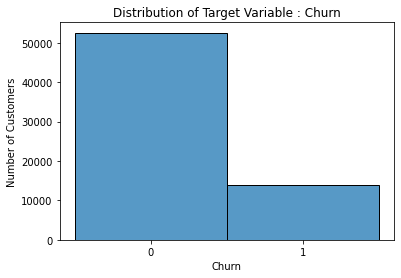

In [ ]:
df['churn']=df['churn'].astype(str)
sns.histplot(df['churn'])
plt.title("Distribution of Target Variable : Churn")
plt.xlabel("Churn")
plt.ylabel("Number of Customers")
plt.show()

We can see that the dataset is a little imbalanced with the number of customers who have not dropped the service being at least 4 times the number of customers who have dropped the service. In such a situation, since we are trying to predict if a customer would drop or not, we have to perform oversampling or undersampling to predict the 1s (customers who might drop the service) accurately.

# Data Pre-processing

### Dropping the Missing Values

In [ ]:
df=df.dropna()

* Instead of Data Imputation, we have dropped the missing values in order to maintain data integrity.

In [ ]:
print("\nNumber of Missing Values after Dropping the Missing Values:")
df.isna().sum()


Number of Missing Values after Dropping the Missing Values:


churn                                      0
user_lifetime_8                            0
user_intake_8                              0
user_no_outgoing_activity_in_days_8        0
user_account_balance_last_8                0
                                          ..
last_100_sms_outgoing_count_6              0
last_100_sms_outgoing_to_onnet_count_6     0
last_100_sms_outgoing_to_offnet_count_6    0
last_100_sms_outgoing_to_abroad_count_6    0
last_100_gprs_usage_6                      0
Length: 187, dtype: int64

### Changing Variable Data Types

* Some of the categorical variables in the dataset have 'int' / 'float' datatype & these needs to be changed to 'Object' Datatype.

In [ ]:
# Changing the Datatype of Categorical Variables to 'Object'

df['churn']=df['churn'].astype(object)

In [ ]:
df['user_intake_6']=df['user_intake_6'].astype(object)
df['user_intake_7']=df['user_intake_7'].astype(object)
df['user_intake_8']=df['user_intake_8'].astype(object)

In [ ]:
df['user_has_outgoing_calls_6']=df['user_has_outgoing_calls_6'].astype(object)
df['user_has_outgoing_calls_7']=df['user_has_outgoing_calls_7'].astype(object)
df['user_has_outgoing_calls_8']=df['user_has_outgoing_calls_8'].astype(object)

In [ ]:
df['user_has_outgoing_sms_6']=df['user_has_outgoing_sms_6'].astype(object)
df['user_has_outgoing_sms_7']=df['user_has_outgoing_sms_7'].astype(object)
df['user_has_outgoing_sms_8']=df['user_has_outgoing_sms_8'].astype(object)

In [ ]:
df['user_use_gprs_6']=df['user_use_gprs_6'].astype(object)
df['user_use_gprs_7']=df['user_use_gprs_7'].astype(object)
df['user_use_gprs_8']=df['user_use_gprs_8'].astype(object)

In [ ]:
df['user_does_reload_6']=df['user_does_reload_6'].astype(object)
df['user_does_reload_7']=df['user_does_reload_7'].astype(object)
df['user_does_reload_8']=df['user_does_reload_8'].astype(object)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57656 entries, 376265 to 989825
Columns: 187 entries, churn to last_100_gprs_usage_6
dtypes: float64(142), int64(29), object(16)
memory usage: 82.7+ MB


### Checking for Multicollinearity / Correlation among Continuous Predictor Variables

* In order to check for Multicollinearity , we will use VIF (Variance Inflation Factor) & also look for the correlations between the predictor variables as well.

In [ ]:
df_corr=df
df_corr=df_corr.drop(['churn','user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8'],axis=1)


Correlation Heat Map



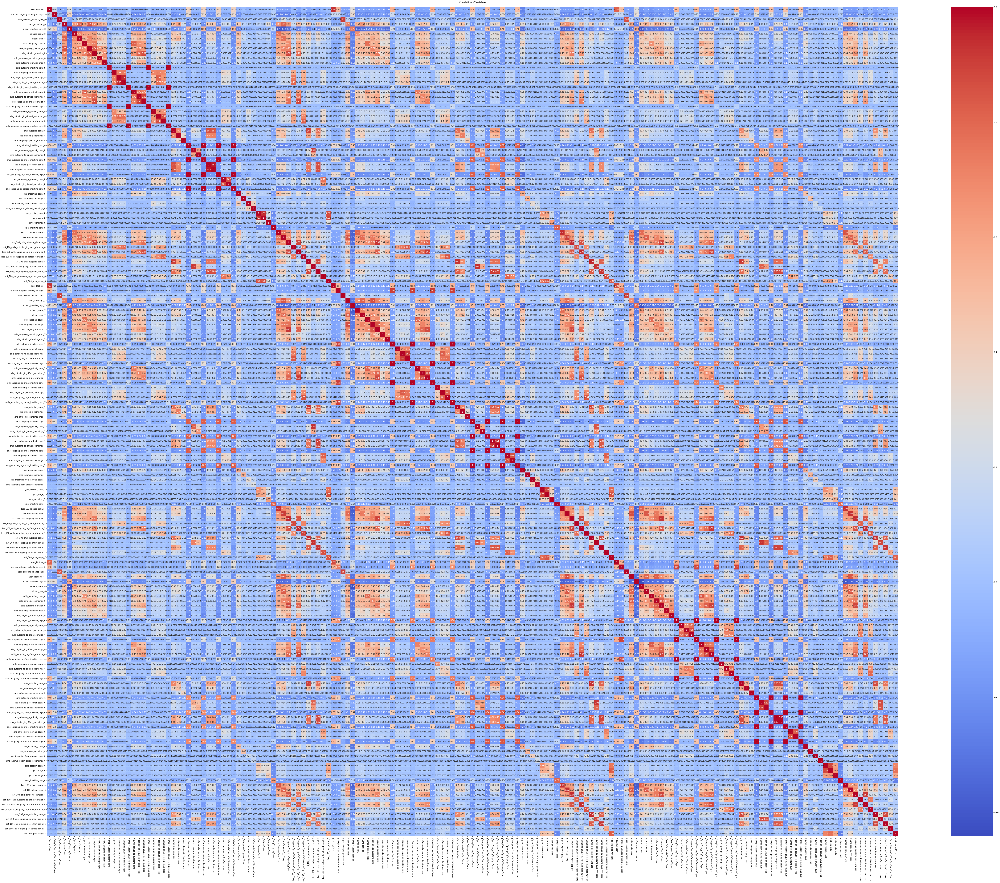

In [ ]:
feature_names = list(df_corr.columns[0:])
X=df_corr

# Plotting a Correlation Matrix Heatmap

print('\nCorrelation Heat Map')
print()
plt.figure(figsize = (100,80))
sns.heatmap(pd.DataFrame(df_corr,columns=feature_names).corr(), annot=True,cmap='coolwarm')
plt.title('Correlation of Variables\n')
plt.show()

print()

* From the Correlation Heat Map , we can see that there are certain continuous predictor variables that are highly correlated. 

* To remove the highly correlated variables, we are checking the VIFs for the predictor variables.

In [ ]:
# First Iteration
print('Variance Inflation Factors (VIF)')
print()
print('> 5: Multicollinearity Problem')
print('> 10: Certain Multicollinearity among the variables')
print()
print('-------------------------------------')

# Calculate VIFs 

X=add_constant(df_corr)
feat_names=X.columns[0:]

VIF =[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
for idx, vif in enumerate(VIF):
    print('{0}: {1}'.format(feat_names[idx], vif))
    
# Printing Total Cases of Possible or Definite Multicollinearity

problem_multicollinearity = sum([1 for vif in VIF if vif > 5])
certain_multicollinearity = sum([1 for vif in VIF if vif > 10])
print()
print('{0} cases of Problematic Multicollinearity'.format(problem_multicollinearity))
print('{0} cases of Certain Multicollinearity'.format(certain_multicollinearity))
print()

Variance Inflation Factors (VIF)

> 5: Multicollinearity Problem
> 10: Certain Multicollinearity among the variables

-------------------------------------


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.7/dist-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const: 25.498674927740307
user_lifetime_8: 8.893907325711222
user_no_outgoing_activity_in_days_8: 1.2941640321924526
user_account_balance_last_8: 476.8898596711361
user_spendings_8: 3552711157.10469
reloads_inactive_days_8: 3.1216373770948826
reloads_count_8: 6.2369073638253685
reloads_sum_8: 316.40413517118316
calls_outgoing_count_8: 11.84321343496019
calls_outgoing_spendings_8: 2069537698.1471286
calls_outgoing_duration_8: 734.6761350347592
calls_outgoing_spendings_max_8: 4.141982684260135
calls_outgoing_duration_max_8: 4.047055967228603
calls_outgoing_inactive_days_8: inf
calls_outgoing_to_onnet_count_8: 3.8165060770811836
calls_outgoing_to_onnet_spendings_8: 15.022672390477396
calls_outgoing_to_onnet_duration_8: 214.80194964320202
calls_outgoing_to_onnet_inactive_days_8: inf
calls_outgoing_to_offnet_count_8: 10.610490931953096
calls_outgoing_to_offnet_spendings_8: 21.242938382966475
calls_outgoing_to_offnet_duration_8: 582.4802227769549
calls_outgoing_to_offnet_inactive_days_8: inf

In [ ]:
df_corr=df_corr.drop(['calls_outgoing_inactive_days_8','calls_outgoing_to_onnet_inactive_days_8','calls_outgoing_to_offnet_inactive_days_8','calls_outgoing_to_abroad_inactive_days_8','sms_outgoing_inactive_days_8','sms_outgoing_to_onnet_inactive_days_8','sms_outgoing_to_offnet_inactive_days_8','sms_outgoing_to_abroad_inactive_days_8','calls_outgoing_inactive_days_7','calls_outgoing_to_onnet_inactive_days_7','calls_outgoing_to_offnet_inactive_days_7','calls_outgoing_to_abroad_inactive_days_7','sms_outgoing_inactive_days_7','sms_outgoing_to_onnet_inactive_days_7','sms_outgoing_to_offnet_inactive_days_7','sms_outgoing_to_abroad_inactive_days_7','calls_outgoing_inactive_days_6','calls_outgoing_to_onnet_inactive_days_6','calls_outgoing_to_offnet_inactive_days_6','calls_outgoing_to_abroad_inactive_days_6','sms_outgoing_inactive_days_6','sms_outgoing_to_onnet_inactive_days_6','sms_outgoing_to_offnet_inactive_days_6','sms_outgoing_to_abroad_inactive_days_6'],axis=1)

* After the first iteration of checking for VIFs, we found that there was a total of 122 Cases of Certain Multicollinearity.So,we have removed all the variables for which VIF is 'inf'(infinity) to go for the second iteration. When VIF = Infinity, it means that there is perfect correlation.

In [ ]:
# Second Iteration
print('Variance Inflation Factors (VIF)')
print()
print('> 5: Multicollinearity Problem')
print('> 10: Certain Multicollinearity among the variables')
print()
print('-------------------------------------')

# Calculate VIFs 

X=add_constant(df_corr)
feat_names=X.columns[0:]

VIF =[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
for idx, vif in enumerate(VIF):
    print('{0}: {1}'.format(feat_names[idx], vif))
    
# Printing Total Cases of Possible or Definite Multicollinearity

problem_multicollinearity = sum([1 for vif in VIF if vif > 5])
certain_multicollinearity = sum([1 for vif in VIF if vif > 10])
print()
print('{0} cases of Problematic Multicollinearity'.format(problem_multicollinearity))
print('{0} cases of Certain Multicollinearity'.format(certain_multicollinearity))
print()

Variance Inflation Factors (VIF)

> 5: Multicollinearity Problem
> 10: Certain Multicollinearity among the variables

-------------------------------------


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


const: 25.438820070386978
user_lifetime_8: 8.42562671918358
user_no_outgoing_activity_in_days_8: 1.2729669231828078
user_account_balance_last_8: 476.8400953053258
user_spendings_8: 3552608865.4073367
reloads_inactive_days_8: 2.8532563828334867
reloads_count_8: 6.229666687044801
reloads_sum_8: 316.36246189951646
calls_outgoing_count_8: 11.8398559664553
calls_outgoing_spendings_8: 2069477785.999775
calls_outgoing_duration_8: 734.6480620897067
calls_outgoing_spendings_max_8: 4.141017584324872
calls_outgoing_duration_max_8: 4.042383003363932
calls_outgoing_to_onnet_count_8: 3.8164701099465366
calls_outgoing_to_onnet_spendings_8: 15.022500664535396
calls_outgoing_to_onnet_duration_8: 214.791353006674
calls_outgoing_to_offnet_count_8: 10.60528648427574
calls_outgoing_to_offnet_spendings_8: 21.233824831089777
calls_outgoing_to_offnet_duration_8: 582.4655756741723
calls_outgoing_to_abroad_count_8: 3.3561875759670983
calls_outgoing_to_abroad_spendings_8: 8.761762197517001
calls_outgoing_to_abro

In [ ]:
df_corr=df_corr.drop(['user_account_balance_last_8','user_spendings_8','reloads_sum_8','calls_outgoing_spendings_8','calls_outgoing_duration_8','calls_outgoing_to_onnet_duration_8','calls_outgoing_to_offnet_duration_8','calls_outgoing_to_abroad_duration_8','sms_outgoing_count_8','sms_outgoing_spendings_8','sms_outgoing_to_onnet_count_8','sms_outgoing_to_offnet_count_8','sms_outgoing_to_abroad_count_8','gprs_spendings_8','last_100_reloads_sum_8','last_100_calls_outgoing_duration_8','last_100_calls_outgoing_to_onnet_duration_8','last_100_calls_outgoing_to_offnet_duration_8','last_100_calls_outgoing_to_abroad_duration_8','last_100_sms_outgoing_count_8','last_100_sms_outgoing_to_onnet_count_8','last_100_sms_outgoing_to_offnet_count_8','last_100_sms_outgoing_to_abroad_count_8','last_100_gprs_usage_8'],axis=1)

In [ ]:
df_corr=df_corr.drop(['user_account_balance_last_7','user_spendings_7','reloads_sum_7','calls_outgoing_spendings_7','calls_outgoing_duration_7','calls_outgoing_to_onnet_duration_7','calls_outgoing_to_offnet_duration_7','calls_outgoing_to_abroad_duration_7','sms_outgoing_count_7','sms_outgoing_spendings_7','sms_outgoing_to_onnet_count_7','sms_outgoing_to_offnet_count_7','sms_outgoing_to_abroad_count_7','gprs_spendings_7','last_100_calls_outgoing_duration_7','last_100_calls_outgoing_to_offnet_duration_7','last_100_sms_outgoing_count_7','last_100_sms_outgoing_to_offnet_count_7'],axis=1)

In [ ]:
df_corr=df_corr.drop(['user_account_balance_last_6','user_spendings_6','calls_outgoing_spendings_6','calls_outgoing_duration_6','calls_outgoing_to_onnet_duration_6','calls_outgoing_to_offnet_duration_6','calls_outgoing_to_abroad_duration_6','sms_outgoing_count_6','sms_outgoing_spendings_6','sms_outgoing_to_onnet_count_6','sms_outgoing_to_offnet_count_6','sms_outgoing_to_abroad_count_6','gprs_spendings_6','last_100_calls_outgoing_duration_6','last_100_calls_outgoing_to_offnet_duration_6','last_100_sms_outgoing_count_6'],axis=1)

* After the second iteration of checking for VIFs, we found that there was a total of 96 Cases of Certain Multicollinearity.So,we have removed all the variables for which VIF>100 to go for the third iteration.

In [ ]:
# Third Iteration
print('Variance Inflation Factors (VIF)')
print()
print('> 5: Multicollinearity Problem')
print('> 10: Certain Multicollinearity among the variables')
print()
print('-------------------------------------')

# Calculate VIFs 

X=add_constant(df_corr)
feat_names=X.columns[0:]

VIF =[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
for idx, vif in enumerate(VIF):
    print('{0}: {1}'.format(feat_names[idx], vif))
    
# Printing Total Cases of Possible or Definite Multicollinearity

problem_multicollinearity = sum([1 for vif in VIF if vif > 5])
certain_multicollinearity = sum([1 for vif in VIF if vif > 10])
print()
print('{0} cases of Problematic Multicollinearity'.format(problem_multicollinearity))
print('{0} cases of Certain Multicollinearity'.format(certain_multicollinearity))
print()

Variance Inflation Factors (VIF)

> 5: Multicollinearity Problem
> 10: Certain Multicollinearity among the variables

-------------------------------------


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


const: 23.945279826158217
user_lifetime_8: 8.359752245055148
user_no_outgoing_activity_in_days_8: 1.2654509153344742
reloads_inactive_days_8: 2.7104986692757214
reloads_count_8: 4.9519511690789635
calls_outgoing_count_8: 9.52238378704655
calls_outgoing_spendings_max_8: 2.5379242342979142
calls_outgoing_duration_max_8: 2.9999604524543426
calls_outgoing_to_onnet_count_8: 3.4886359778970886
calls_outgoing_to_onnet_spendings_8: 4.259141240715867
calls_outgoing_to_offnet_count_8: 9.777935851751765
calls_outgoing_to_offnet_spendings_8: 5.886082614966524
calls_outgoing_to_abroad_count_8: 3.164327100626445
calls_outgoing_to_abroad_spendings_8: 4.901438486727099
sms_outgoing_spendings_max_8: 1.3804831486950868
sms_outgoing_to_onnet_spendings_8: 1.893608728156608
sms_outgoing_to_offnet_spendings_8: 2.5127416921099655
sms_outgoing_to_abroad_spendings_8: 1.4015584840706707
sms_incoming_count_8: 3.068526938619204
sms_incoming_spendings_8: 1.7237205807772387
sms_incoming_from_abroad_count_8: 1.93918

In [ ]:
df_corr=df_corr.drop(['gprs_session_count_8','gprs_usage_8','last_100_reloads_count_8','user_lifetime_7','calls_outgoing_count_7','calls_outgoing_to_offnet_count_7','gprs_session_count_7','gprs_usage_7','last_100_reloads_count_7','last_100_reloads_sum_7','last_100_calls_outgoing_to_onnet_duration_7','last_100_calls_outgoing_to_abroad_duration_7','last_100_gprs_usage_7','calls_outgoing_count_6','calls_outgoing_to_offnet_count_6','gprs_session_count_6','gprs_usage_6','last_100_reloads_count_6','last_100_reloads_sum_6','last_100_gprs_usage_6'],axis=1)

* After the third iteration of checking for VIFs, we found that there was a total of 21 Cases of Certain Multicollinearity.So,we have removed all the variables for which VIF>10 to go for the fourth iteration.

In [ ]:
# Fourth Iteration
print('Variance Inflation Factors (VIF)')
print()
print('> 5: Multicollinearity Problem')
print('> 10: Certain Multicollinearity among the variables')
print()
print('-------------------------------------')

# Calculate VIFs 

X=add_constant(df_corr)
feat_names=X.columns[0:]

VIF =[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
for idx, vif in enumerate(VIF):
    print('{0}: {1}'.format(feat_names[idx], vif))
    
# Printing Total Cases of Possible or Definite Multicollinearity

problem_multicollinearity = sum([1 for vif in VIF if vif > 5])
certain_multicollinearity = sum([1 for vif in VIF if vif > 10])
print()
print('{0} cases of Problematic Multicollinearity'.format(problem_multicollinearity))
print('{0} cases of Certain Multicollinearity'.format(certain_multicollinearity))
print()

Variance Inflation Factors (VIF)

> 5: Multicollinearity Problem
> 10: Certain Multicollinearity among the variables

-------------------------------------


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


const: 22.463212552647256
user_lifetime_8: 3.5725039176530236
user_no_outgoing_activity_in_days_8: 1.263622357441839
reloads_inactive_days_8: 2.6342152807911257
reloads_count_8: 3.2312692965602183
calls_outgoing_count_8: 4.866314058391174
calls_outgoing_spendings_max_8: 2.503958851411502
calls_outgoing_duration_max_8: 2.9569172690515617
calls_outgoing_to_onnet_count_8: 3.464730505246395
calls_outgoing_to_onnet_spendings_8: 4.180749693235877
calls_outgoing_to_offnet_count_8: 4.7013070091075795
calls_outgoing_to_offnet_spendings_8: 4.387009629480945
calls_outgoing_to_abroad_count_8: 3.000502149705407
calls_outgoing_to_abroad_spendings_8: 4.73960227842713
sms_outgoing_spendings_max_8: 1.3756266105661052
sms_outgoing_to_onnet_spendings_8: 1.8892862406942093
sms_outgoing_to_offnet_spendings_8: 2.480949769591394
sms_outgoing_to_abroad_spendings_8: 1.3906810962394447
sms_incoming_count_8: 2.9458527494228743
sms_incoming_spendings_8: 1.7195542671264663
sms_incoming_from_abroad_count_8: 1.91243

* After the fourth iteration of checking for VIFs, we found that there was a total of only 1 Case of Certain Multicollinearity. But this corresponds to the constant added to the dataframe. Hence, we can say that after the fourth & final iteration, there are 0 Cases of Certain Multicollinearity.We can therefore proceed with this final set of continuous variables.

## Box Plots for Continuous Variables





	Box Plot for the Variable : user_lifetime_8


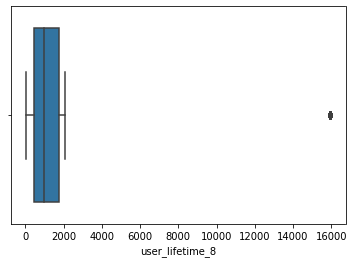





	Box Plot for the Variable : user_no_outgoing_activity_in_days_8


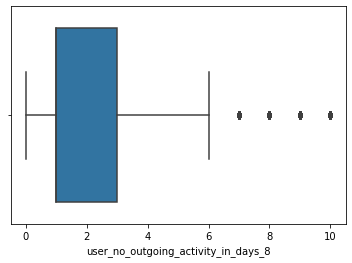





	Box Plot for the Variable : reloads_inactive_days_8


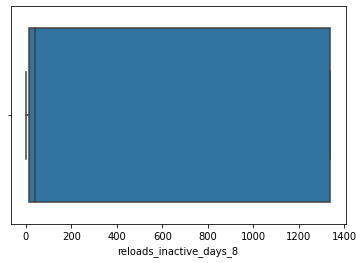





	Box Plot for the Variable : reloads_count_8


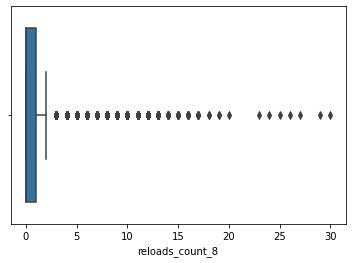





	Box Plot for the Variable : calls_outgoing_count_8


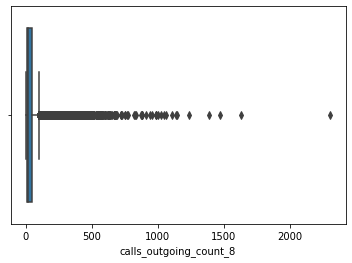





	Box Plot for the Variable : calls_outgoing_spendings_max_8


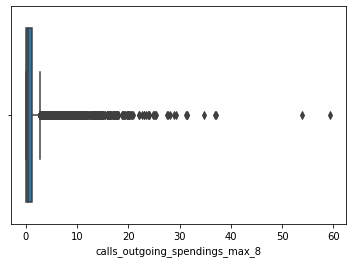





	Box Plot for the Variable : calls_outgoing_duration_max_8


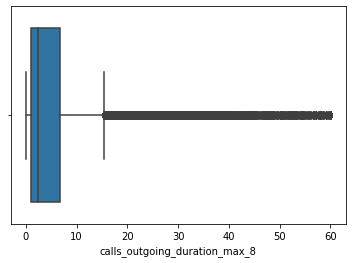





	Box Plot for the Variable : calls_outgoing_to_onnet_count_8


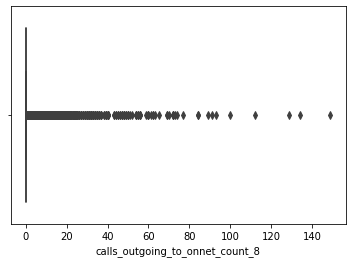





	Box Plot for the Variable : calls_outgoing_to_onnet_spendings_8


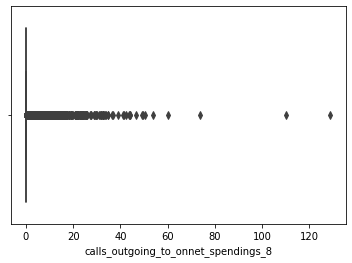





	Box Plot for the Variable : calls_outgoing_to_offnet_count_8


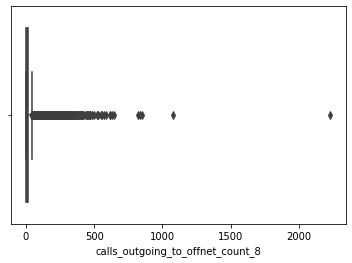





	Box Plot for the Variable : calls_outgoing_to_offnet_spendings_8


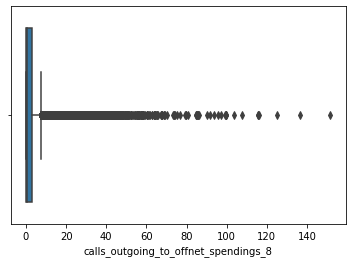





	Box Plot for the Variable : calls_outgoing_to_abroad_count_8


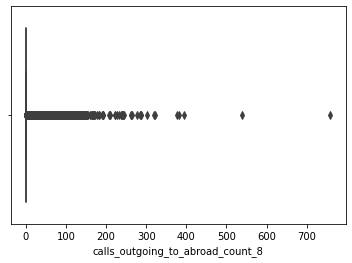





	Box Plot for the Variable : calls_outgoing_to_abroad_spendings_8


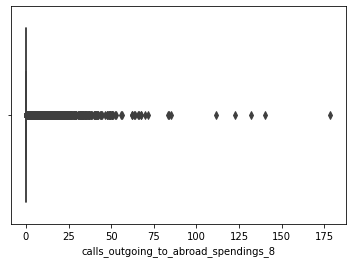





	Box Plot for the Variable : sms_outgoing_spendings_max_8


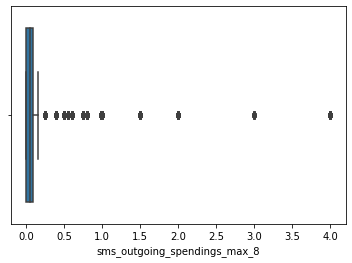





	Box Plot for the Variable : sms_outgoing_to_onnet_spendings_8


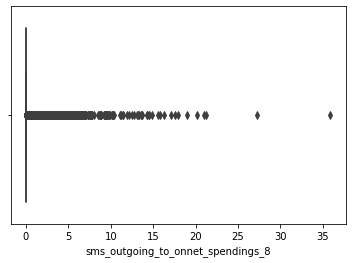





	Box Plot for the Variable : sms_outgoing_to_offnet_spendings_8


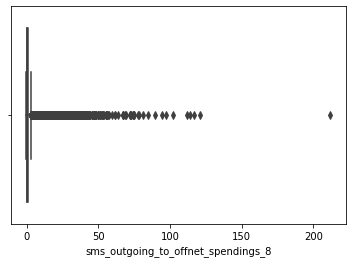





	Box Plot for the Variable : sms_outgoing_to_abroad_spendings_8


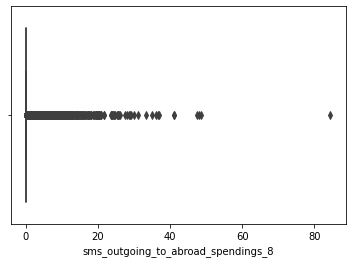





	Box Plot for the Variable : sms_incoming_count_8


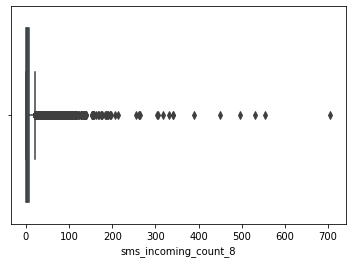





	Box Plot for the Variable : sms_incoming_spendings_8


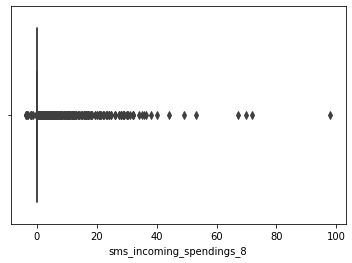





	Box Plot for the Variable : sms_incoming_from_abroad_count_8


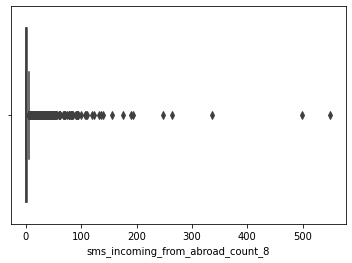





	Box Plot for the Variable : sms_incoming_from_abroad_spendings_8


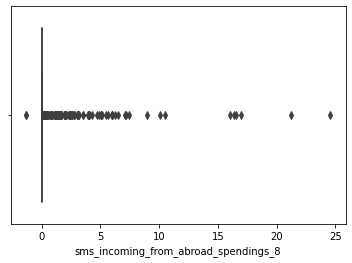





	Box Plot for the Variable : gprs_inactive_days_8


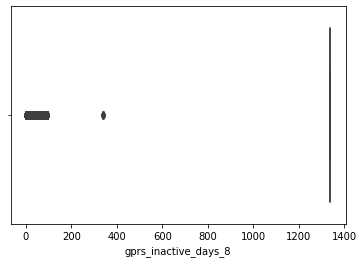





	Box Plot for the Variable : user_no_outgoing_activity_in_days_7


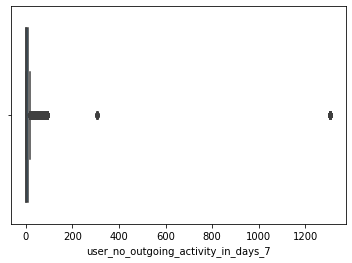





	Box Plot for the Variable : reloads_inactive_days_7


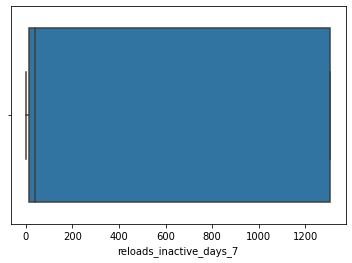





	Box Plot for the Variable : reloads_count_7


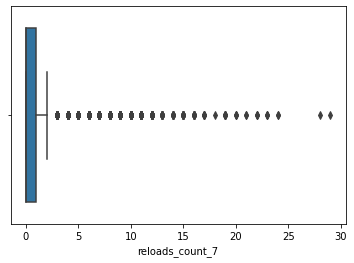





	Box Plot for the Variable : calls_outgoing_spendings_max_7


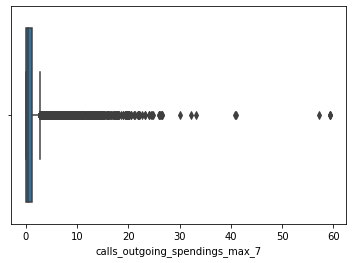





	Box Plot for the Variable : calls_outgoing_duration_max_7


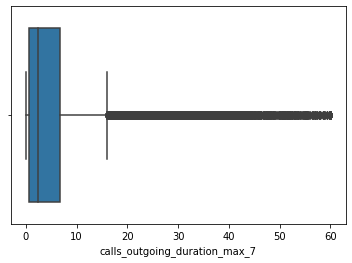





	Box Plot for the Variable : calls_outgoing_to_onnet_count_7


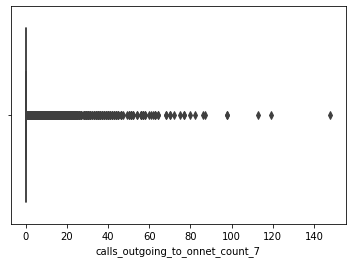





	Box Plot for the Variable : calls_outgoing_to_onnet_spendings_7


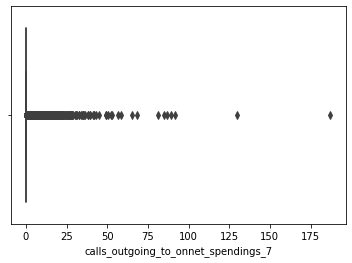





	Box Plot for the Variable : calls_outgoing_to_offnet_spendings_7


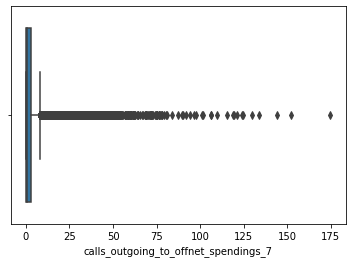





	Box Plot for the Variable : calls_outgoing_to_abroad_count_7


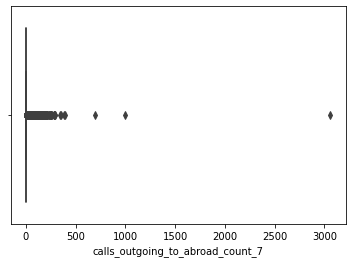





	Box Plot for the Variable : calls_outgoing_to_abroad_spendings_7


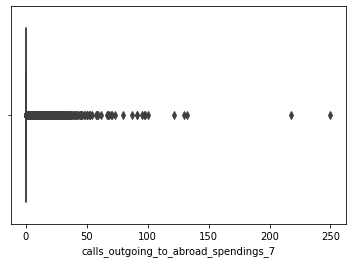





	Box Plot for the Variable : sms_outgoing_spendings_max_7


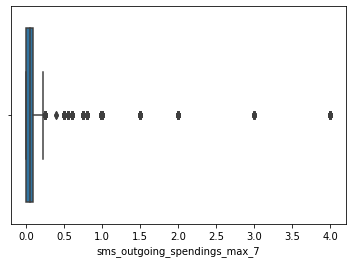





	Box Plot for the Variable : sms_outgoing_to_onnet_spendings_7


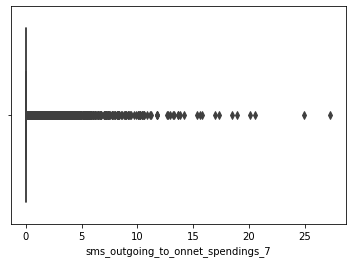





	Box Plot for the Variable : sms_outgoing_to_offnet_spendings_7


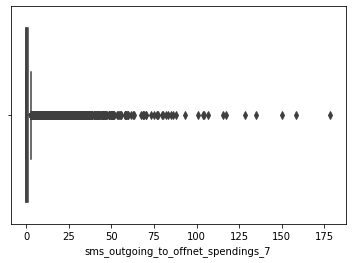





	Box Plot for the Variable : sms_outgoing_to_abroad_spendings_7


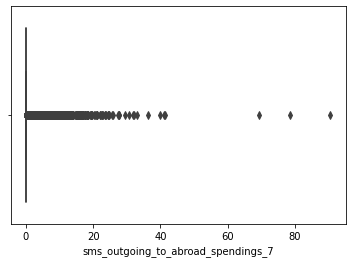





	Box Plot for the Variable : sms_incoming_count_7


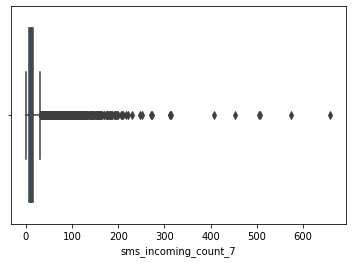





	Box Plot for the Variable : sms_incoming_spendings_7


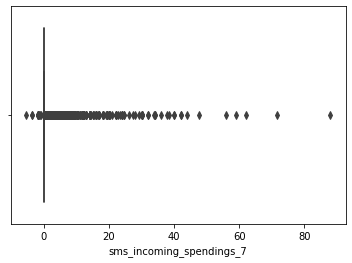





	Box Plot for the Variable : sms_incoming_from_abroad_count_7


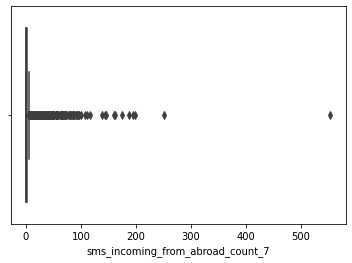





	Box Plot for the Variable : sms_incoming_from_abroad_spendings_7


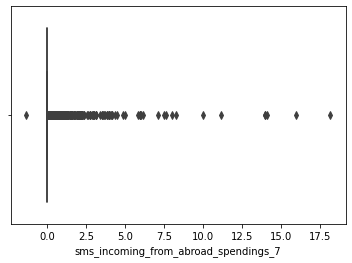





	Box Plot for the Variable : gprs_inactive_days_7


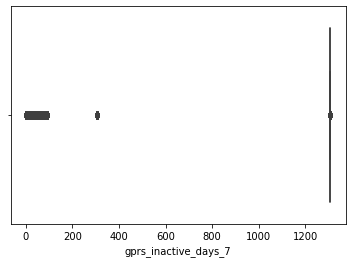





	Box Plot for the Variable : last_100_sms_outgoing_to_onnet_count_7


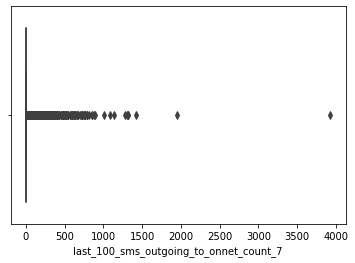





	Box Plot for the Variable : last_100_sms_outgoing_to_abroad_count_7


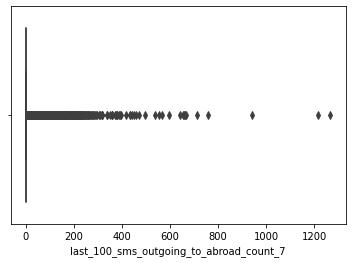





	Box Plot for the Variable : user_lifetime_6


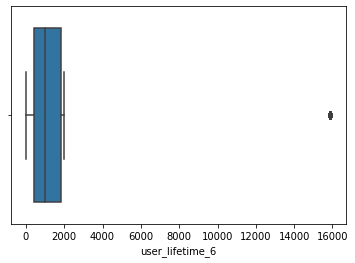





	Box Plot for the Variable : user_no_outgoing_activity_in_days_6


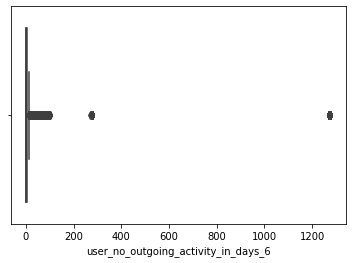





	Box Plot for the Variable : reloads_inactive_days_6


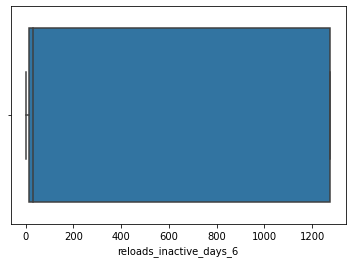





	Box Plot for the Variable : reloads_count_6


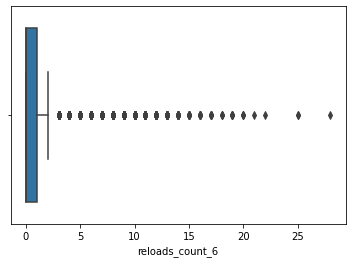





	Box Plot for the Variable : reloads_sum_6


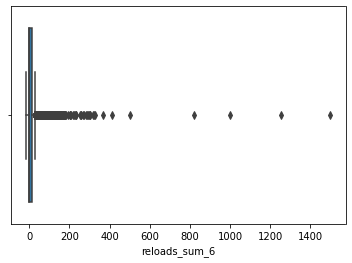





	Box Plot for the Variable : calls_outgoing_spendings_max_6


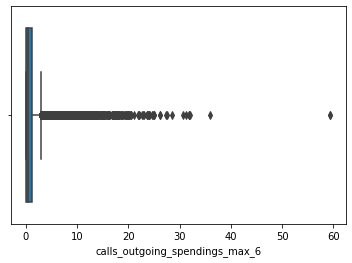





	Box Plot for the Variable : calls_outgoing_duration_max_6


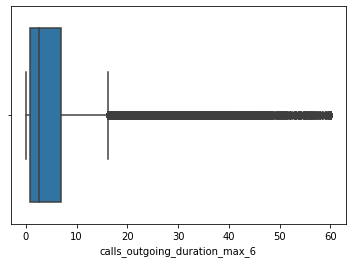





	Box Plot for the Variable : calls_outgoing_to_onnet_count_6


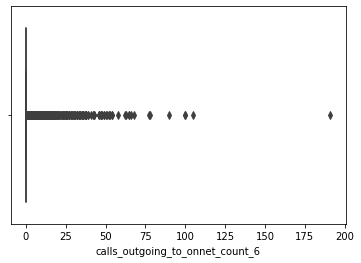





	Box Plot for the Variable : calls_outgoing_to_onnet_spendings_6


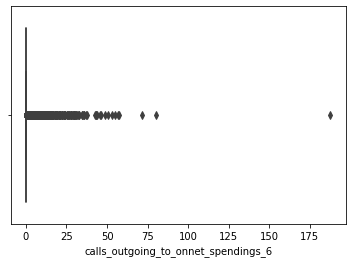





	Box Plot for the Variable : calls_outgoing_to_offnet_spendings_6


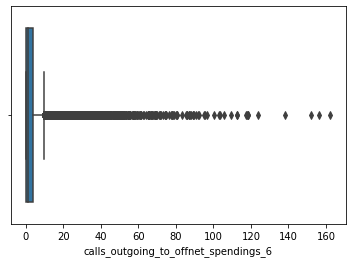





	Box Plot for the Variable : calls_outgoing_to_abroad_count_6


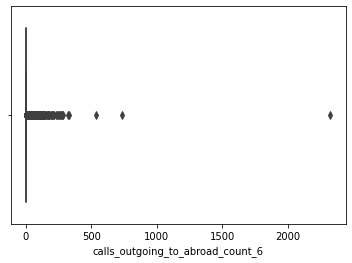





	Box Plot for the Variable : calls_outgoing_to_abroad_spendings_6


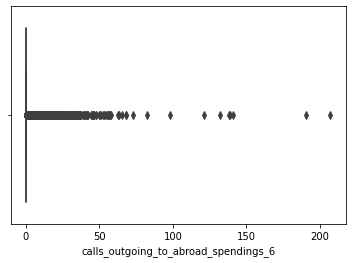





	Box Plot for the Variable : sms_outgoing_spendings_max_6


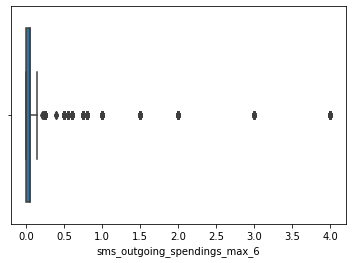





	Box Plot for the Variable : sms_outgoing_to_onnet_spendings_6


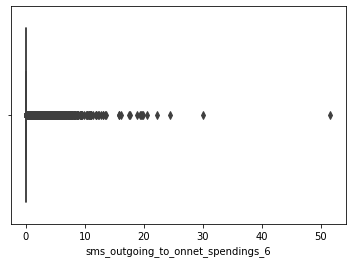





	Box Plot for the Variable : sms_outgoing_to_offnet_spendings_6


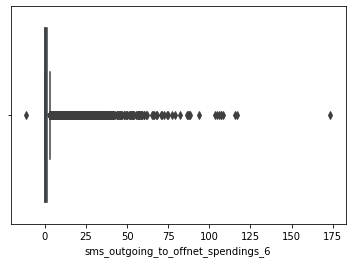





	Box Plot for the Variable : sms_outgoing_to_abroad_spendings_6


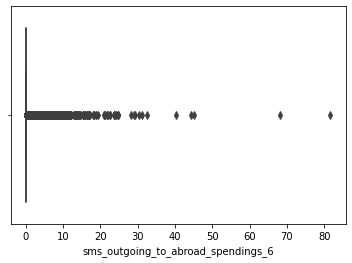





	Box Plot for the Variable : sms_incoming_count_6


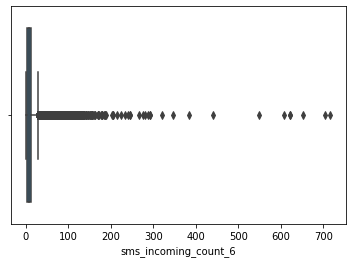





	Box Plot for the Variable : sms_incoming_spendings_6


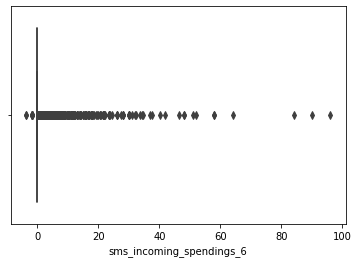





	Box Plot for the Variable : sms_incoming_from_abroad_count_6


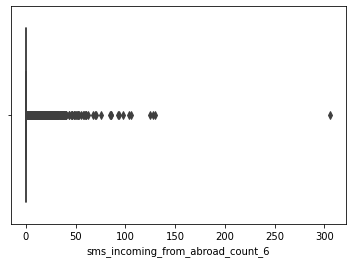





	Box Plot for the Variable : sms_incoming_from_abroad_spendings_6


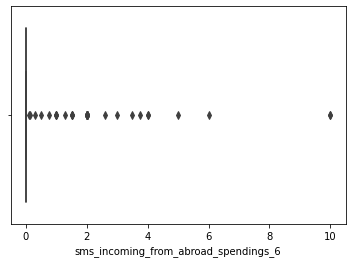





	Box Plot for the Variable : gprs_inactive_days_6


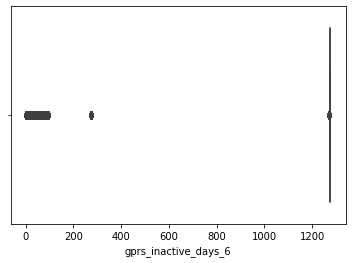





	Box Plot for the Variable : last_100_calls_outgoing_to_onnet_duration_6


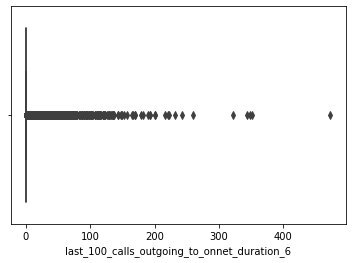





	Box Plot for the Variable : last_100_calls_outgoing_to_abroad_duration_6


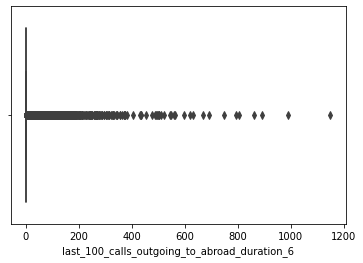





	Box Plot for the Variable : last_100_sms_outgoing_to_onnet_count_6


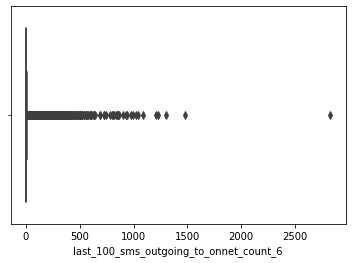





	Box Plot for the Variable : last_100_sms_outgoing_to_offnet_count_6


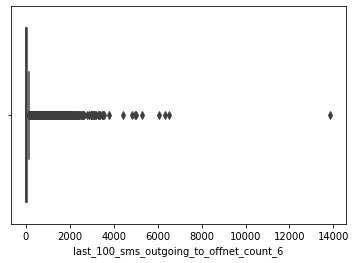





	Box Plot for the Variable : last_100_sms_outgoing_to_abroad_count_6


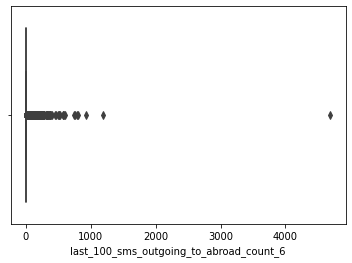

In [ ]:
for i in df_corr.columns :
  print("\n")
  print("\n")
  print("\tBox Plot for the Variable :",i)
  sns.boxplot(x=df_corr[i])
  plt.show()

* From the box plots for the continuous variables we can see that most of these variables have a few outliers.Instead of using IQR method to exclude outliers, we would be transforming the distribution of these variables to remove the outliers.

## Distributions of the Continuous Variables





	Distribution for the Variable : user_lifetime_8


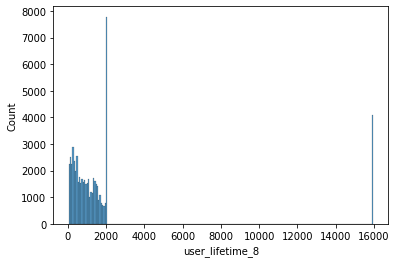





	Distribution for the Variable : user_no_outgoing_activity_in_days_8


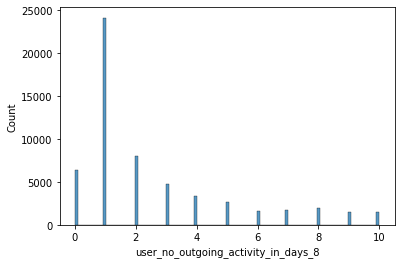





	Distribution for the Variable : reloads_inactive_days_8


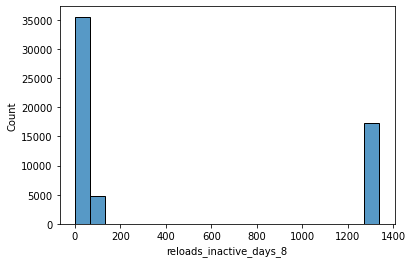





	Distribution for the Variable : reloads_count_8


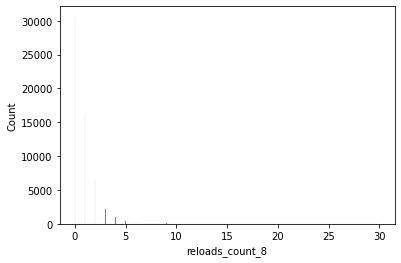





	Distribution for the Variable : calls_outgoing_count_8


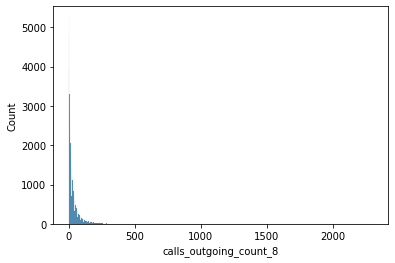





	Distribution for the Variable : calls_outgoing_spendings_max_8


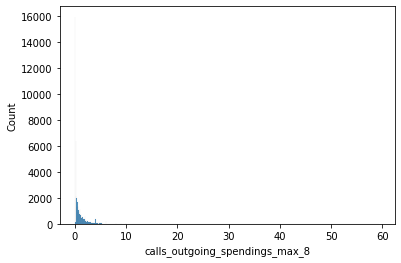





	Distribution for the Variable : calls_outgoing_duration_max_8


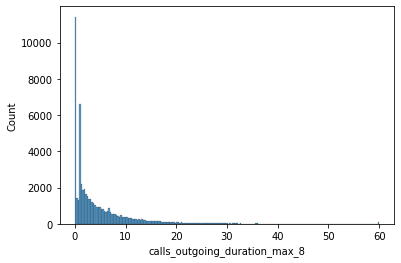





	Distribution for the Variable : calls_outgoing_to_onnet_count_8


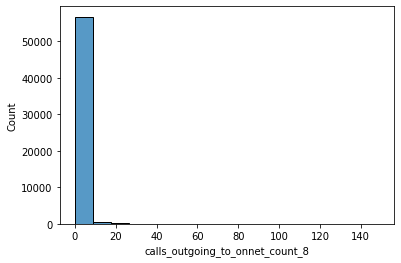





	Distribution for the Variable : calls_outgoing_to_onnet_spendings_8


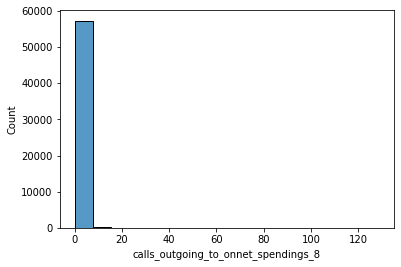





	Distribution for the Variable : calls_outgoing_to_offnet_count_8


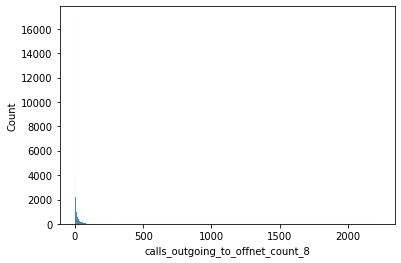





	Distribution for the Variable : calls_outgoing_to_offnet_spendings_8


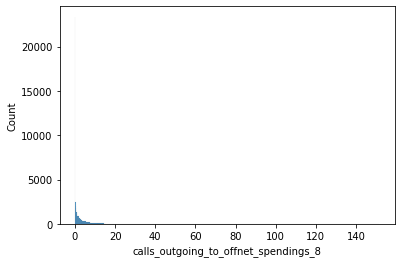





	Distribution for the Variable : calls_outgoing_to_abroad_count_8


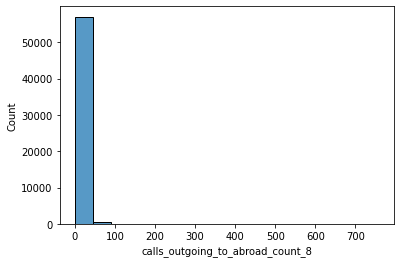





	Distribution for the Variable : calls_outgoing_to_abroad_spendings_8


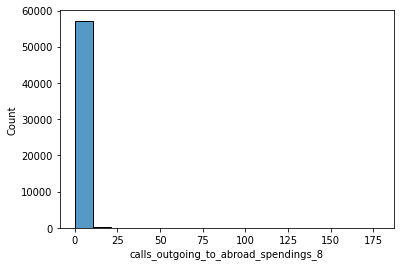





	Distribution for the Variable : sms_outgoing_spendings_max_8


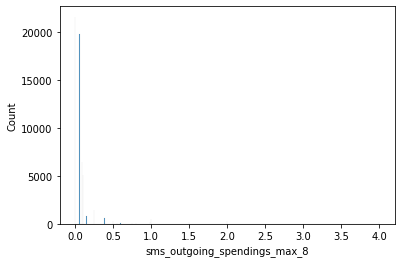





	Distribution for the Variable : sms_outgoing_to_onnet_spendings_8


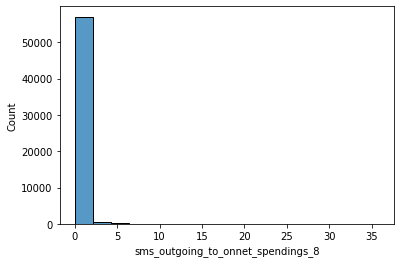





	Distribution for the Variable : sms_outgoing_to_offnet_spendings_8


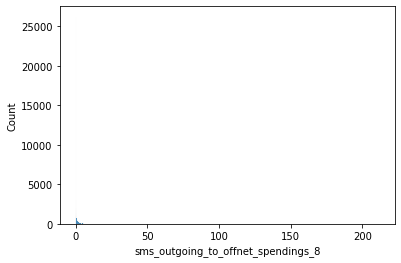





	Distribution for the Variable : sms_outgoing_to_abroad_spendings_8


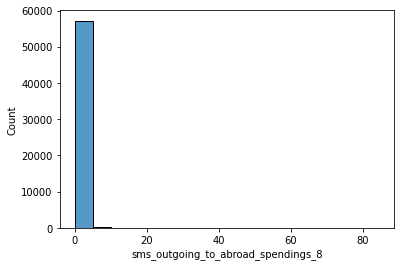





	Distribution for the Variable : sms_incoming_count_8


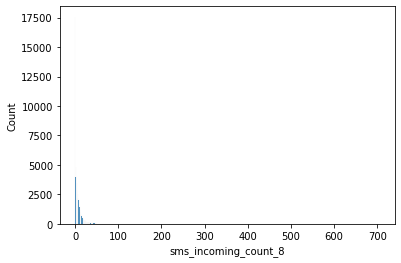





	Distribution for the Variable : sms_incoming_spendings_8


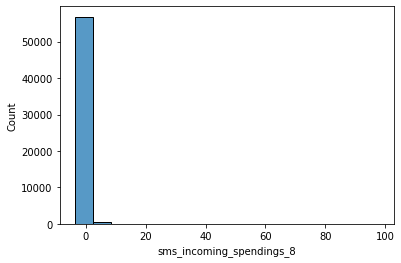





	Distribution for the Variable : sms_incoming_from_abroad_count_8


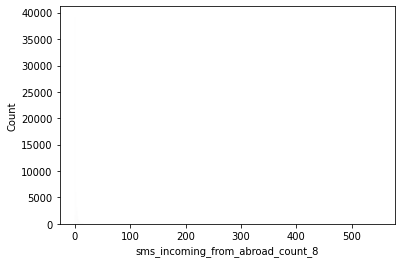





	Distribution for the Variable : sms_incoming_from_abroad_spendings_8


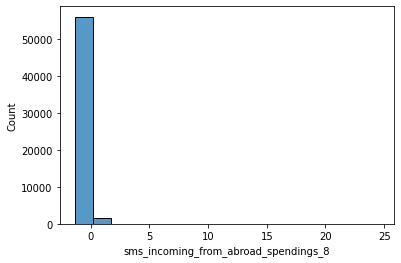





	Distribution for the Variable : gprs_inactive_days_8


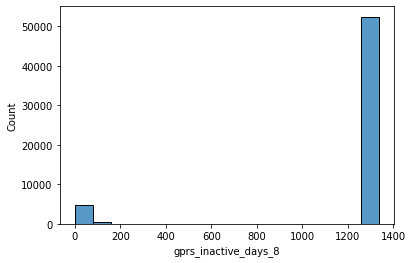





	Distribution for the Variable : user_no_outgoing_activity_in_days_7


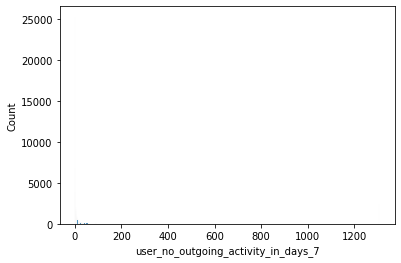





	Distribution for the Variable : reloads_inactive_days_7


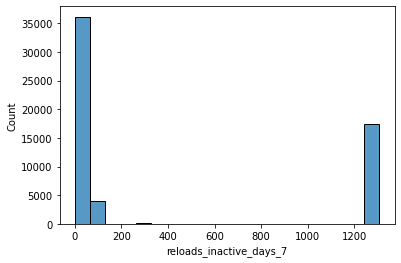





	Distribution for the Variable : reloads_count_7


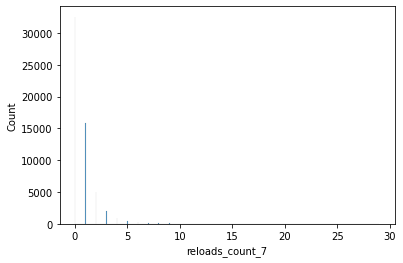





	Distribution for the Variable : calls_outgoing_spendings_max_7


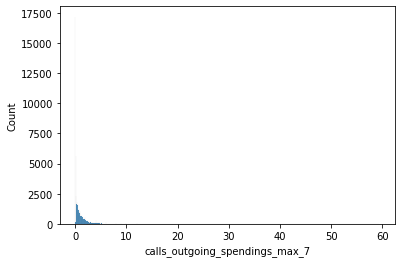





	Distribution for the Variable : calls_outgoing_duration_max_7


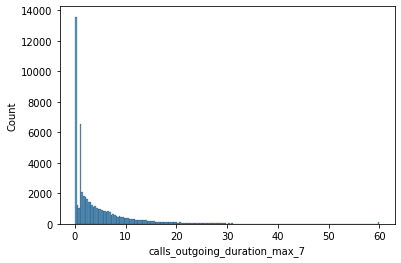





	Distribution for the Variable : calls_outgoing_to_onnet_count_7


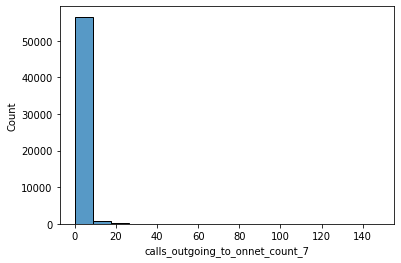





	Distribution for the Variable : calls_outgoing_to_onnet_spendings_7


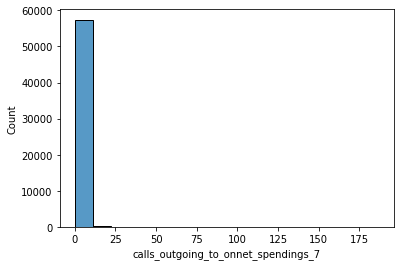





	Distribution for the Variable : calls_outgoing_to_offnet_spendings_7


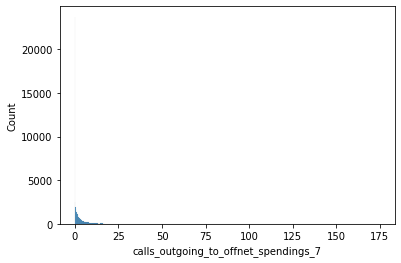





	Distribution for the Variable : calls_outgoing_to_abroad_count_7


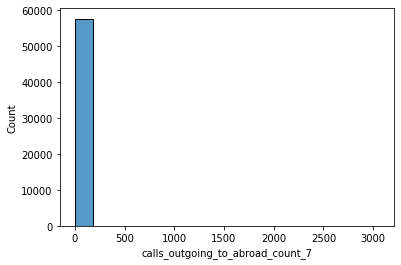





	Distribution for the Variable : calls_outgoing_to_abroad_spendings_7


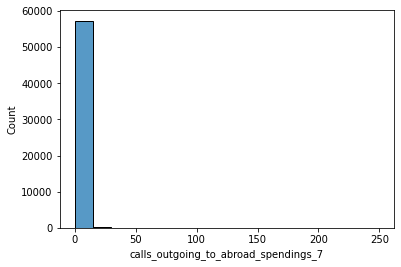





	Distribution for the Variable : sms_outgoing_spendings_max_7


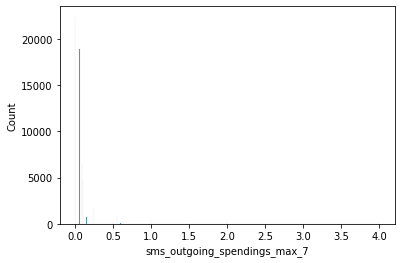





	Distribution for the Variable : sms_outgoing_to_onnet_spendings_7


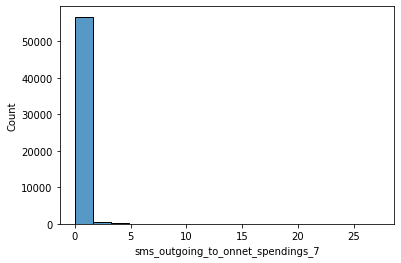





	Distribution for the Variable : sms_outgoing_to_offnet_spendings_7


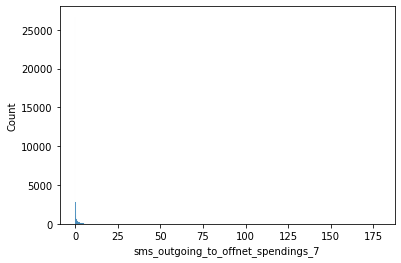





	Distribution for the Variable : sms_outgoing_to_abroad_spendings_7


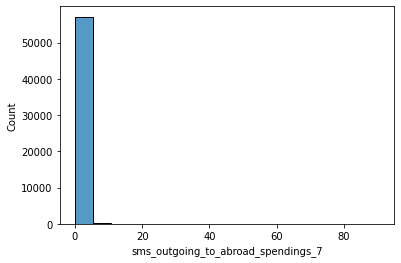





	Distribution for the Variable : sms_incoming_count_7


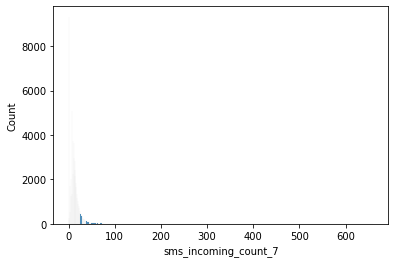





	Distribution for the Variable : sms_incoming_spendings_7


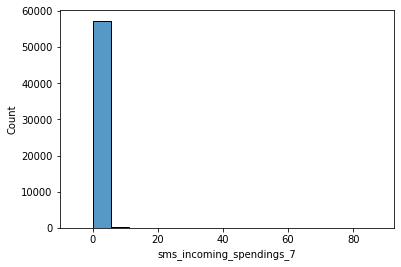





	Distribution for the Variable : sms_incoming_from_abroad_count_7


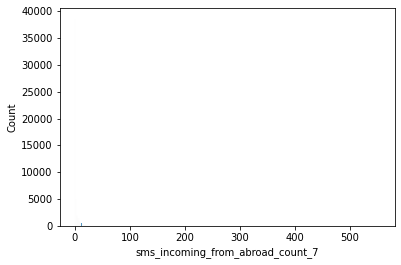





	Distribution for the Variable : sms_incoming_from_abroad_spendings_7


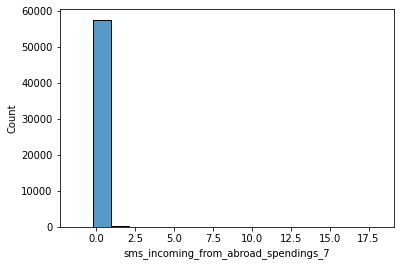





	Distribution for the Variable : gprs_inactive_days_7


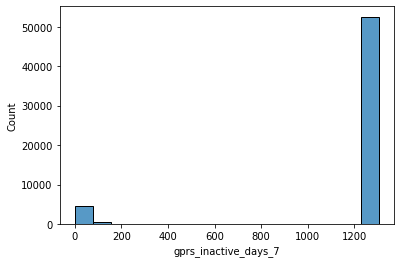





	Distribution for the Variable : last_100_sms_outgoing_to_onnet_count_7


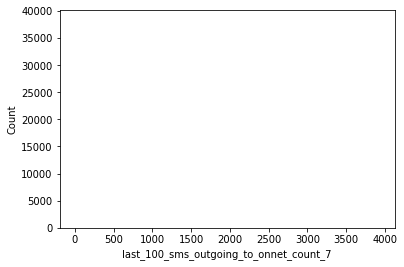





	Distribution for the Variable : last_100_sms_outgoing_to_abroad_count_7


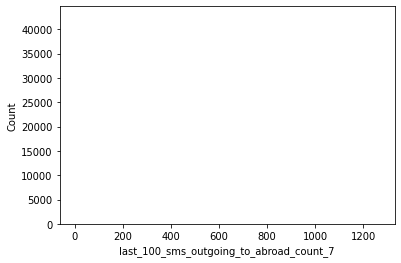





	Distribution for the Variable : user_lifetime_6


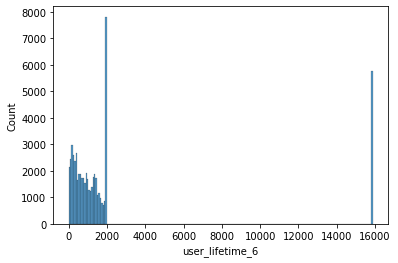





	Distribution for the Variable : user_no_outgoing_activity_in_days_6


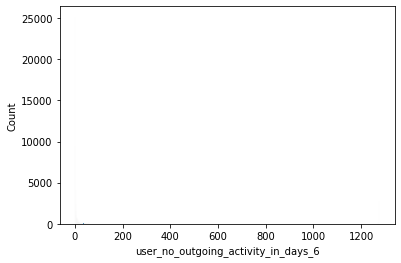





	Distribution for the Variable : reloads_inactive_days_6


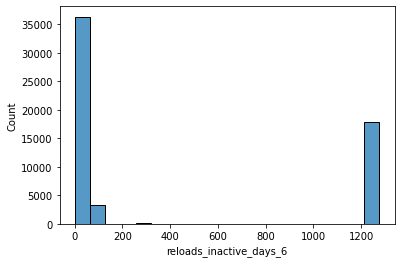





	Distribution for the Variable : reloads_count_6


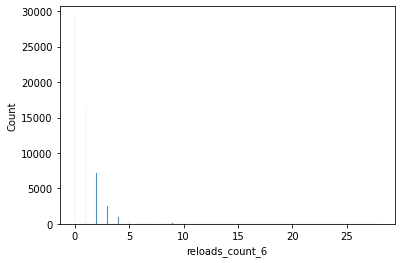





	Distribution for the Variable : reloads_sum_6


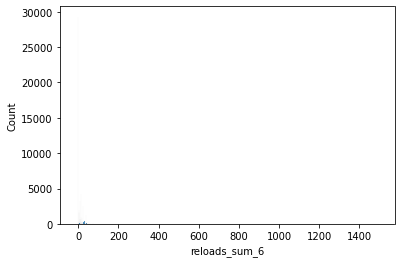





	Distribution for the Variable : calls_outgoing_spendings_max_6


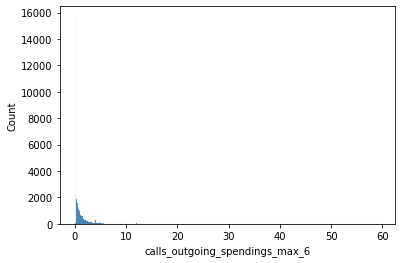





	Distribution for the Variable : calls_outgoing_duration_max_6


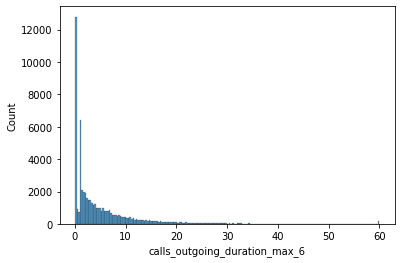





	Distribution for the Variable : calls_outgoing_to_onnet_count_6


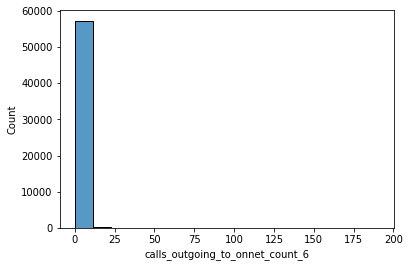





	Distribution for the Variable : calls_outgoing_to_onnet_spendings_6


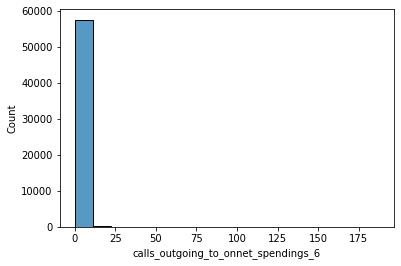





	Distribution for the Variable : calls_outgoing_to_offnet_spendings_6


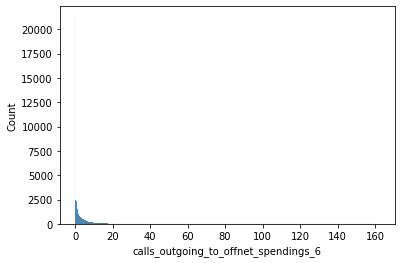





	Distribution for the Variable : calls_outgoing_to_abroad_count_6


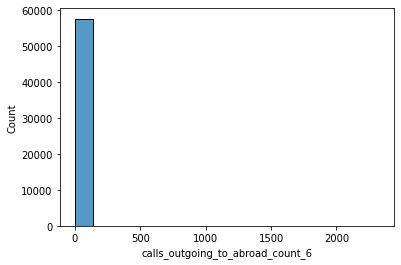





	Distribution for the Variable : calls_outgoing_to_abroad_spendings_6


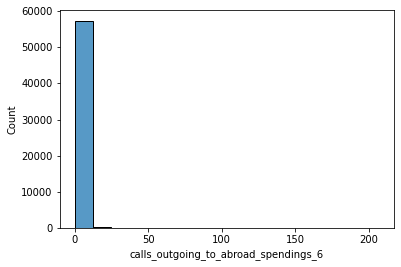





	Distribution for the Variable : sms_outgoing_spendings_max_6


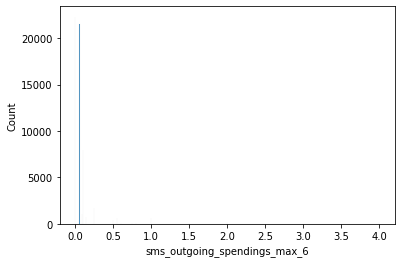





	Distribution for the Variable : sms_outgoing_to_onnet_spendings_6


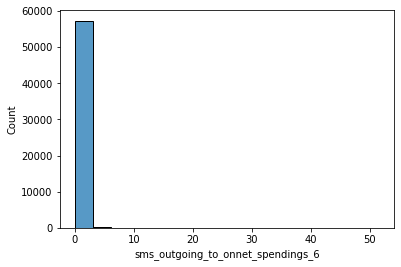





	Distribution for the Variable : sms_outgoing_to_offnet_spendings_6


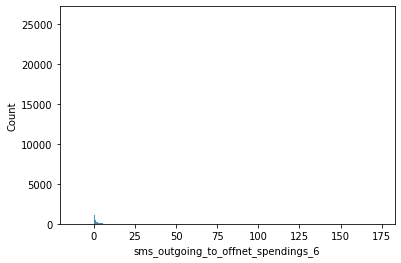





	Distribution for the Variable : sms_outgoing_to_abroad_spendings_6


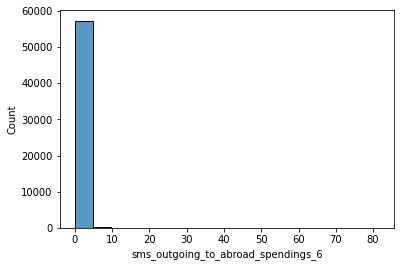





	Distribution for the Variable : sms_incoming_count_6


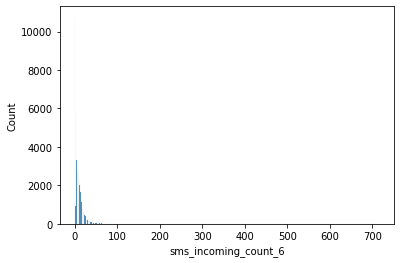





	Distribution for the Variable : sms_incoming_spendings_6


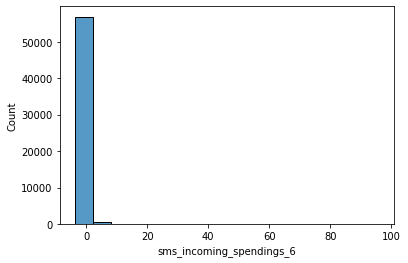





	Distribution for the Variable : sms_incoming_from_abroad_count_6


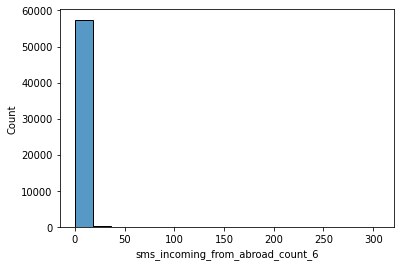





	Distribution for the Variable : sms_incoming_from_abroad_spendings_6


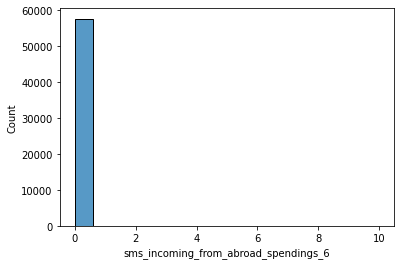





	Distribution for the Variable : gprs_inactive_days_6


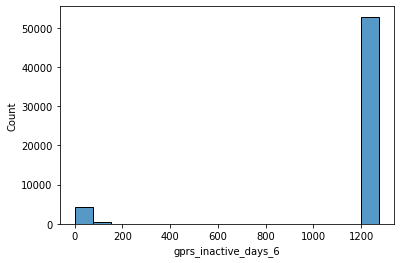





	Distribution for the Variable : last_100_calls_outgoing_to_onnet_duration_6


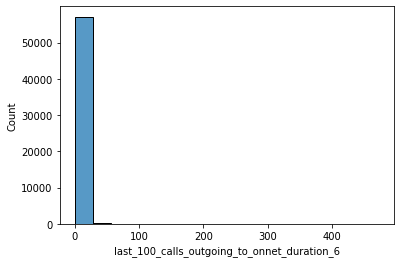





	Distribution for the Variable : last_100_calls_outgoing_to_abroad_duration_6


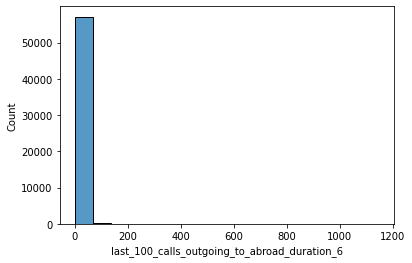





	Distribution for the Variable : last_100_sms_outgoing_to_onnet_count_6


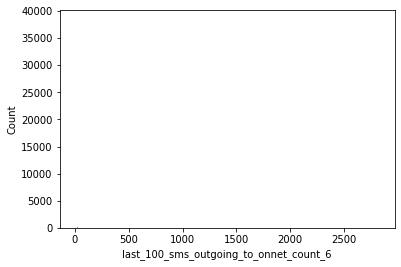





	Distribution for the Variable : last_100_sms_outgoing_to_offnet_count_6


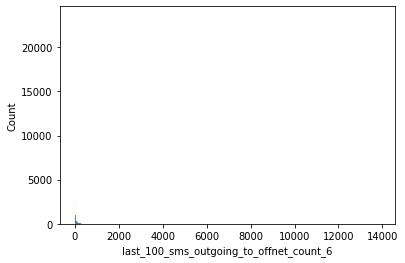





	Distribution for the Variable : last_100_sms_outgoing_to_abroad_count_6


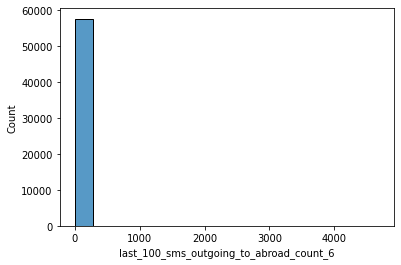

In [ ]:
for i in df_corr.columns :
  print("\n")
  print("\n")
  print("\tDistribution for the Variable :",i)
  sns.histplot(df_corr[i])
  plt.show()

* From the histograms we can see that the distributions for majority of the continuous variables are skewed.Hence,we have to transform the distribution of these continuous variables.

### Adding Categorical Variables back to the DataFrame

In [ ]:
col_names=df_corr.columns

In [ ]:
df_final=pd.DataFrame(df_corr,columns=col_names)

In [ ]:
# Adding Categorical Variables back to the DataFrame
df_final.index=df.index
df_final['churn']=df['churn']
df_final['user_intake_6']=df['user_intake_6']
df_final['user_intake_7']=df['user_intake_7']
df_final['user_intake_8']=df['user_intake_8']
df_final['user_has_outgoing_calls_6']=df['user_has_outgoing_calls_6']
df_final['user_has_outgoing_calls_7']=df['user_has_outgoing_calls_7']
df_final['user_has_outgoing_calls_8']=df['user_has_outgoing_calls_8']
df_final['user_has_outgoing_sms_6']=df['user_has_outgoing_sms_6']
df_final['user_has_outgoing_sms_7']=df['user_has_outgoing_sms_7']
df_final['user_has_outgoing_sms_8']=df['user_has_outgoing_sms_8']
df_final['user_use_gprs_6']=df['user_use_gprs_6']
df_final['user_use_gprs_7']=df['user_use_gprs_7']
df_final['user_use_gprs_8']=df['user_use_gprs_8']
df_final['user_does_reload_6']=df['user_does_reload_6']
df_final['user_does_reload_7']=df['user_does_reload_7']
df_final['user_does_reload_8']=df['user_does_reload_8']

df_final.head()

,user_lifetime_8,user_no_outgoing_activity_in_days_8,reloads_inactive_days_8,reloads_count_8,calls_outgoing_count_8,calls_outgoing_spendings_max_8,calls_outgoing_duration_max_8,calls_outgoing_to_onnet_count_8,calls_outgoing_to_onnet_spendings_8,calls_outgoing_to_offnet_count_8,...,user_has_outgoing_calls_8,user_has_outgoing_sms_6,user_has_outgoing_sms_7,user_has_outgoing_sms_8,user_use_gprs_6,user_use_gprs_7,user_use_gprs_8,user_does_reload_6,user_does_reload_7,user_does_reload_8
user_account_id,,,,,,,,,,,,,,,,,,,,,
376265,87,2,3,3,87,4.96,33.05,0,0.0,43,...,1,1.0,1.0,1,0.0,0.0,0,1.0,1.0,1
1151965,122,2,30,1,60,0.78,12.20,0,0.0,15,...,1,0.0,1.0,1,0.0,0.0,0,1.0,1.0,1
1036474,86,1,1,1,37,0.57,3.80,0,0.0,20,...,1,1.0,1.0,1,0.0,0.0,0,1.0,1.0,1
934461,204,3,39,0,22,0.00,0.58,0,0.0,0,...,1,0.0,0.0,0,0.0,0.0,0,1.0,1.0,0
1129623,238,2,78,0,27,3.53,23.50,0,0.0,17,...,1,1.0,1.0,1,0.0,0.0,0,1.0,0.0,0


## Defining X & Y

In [ ]:
# Defining X & Y

X=df_final.drop(['churn'],axis=1)
y=df_final['churn']
print("Shape of X :",X.shape)
print("Shape of y :",y.shape)

Shape of X : (57656, 84)
Shape of y : (57656,)


In [ ]:
df_final['churn'].value_counts()

0    49850
1     7806
Name: churn, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
# from sklearn.utils.multiclass import type_of_target
# type_of_target(y)

## Data Splitting

### We would be splitting the data using an 80/20 random split using a random_state of 63.

In [ ]:
# Data Splitting

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,shuffle=True,random_state=63)

In [ ]:
# Shapes of Training & Test Sets

print("Shape of X_train:",X_train.shape)
print("Shape of X_test :", X_test.shape)
print("Shape of y_train:",y_train.shape)
print("Shape of y_test :",y_test.shape)

Shape of X_train: (46124, 84)
Shape of X_test : (11532, 84)
Shape of y_train: (46124,)
Shape of y_test : (11532,)


In [ ]:
X_train_temp=X_train.drop(['user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8'],axis=1)
X_test_temp=X_test.drop(['user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8'],axis=1)


## Transforming the Distribution of the Variables

In [ ]:
# Transforming the Distribution of the Variables

power = PowerTransformer(method='yeo-johnson')
X_train_temp=power.fit_transform(X_train_temp)
X_test_temp=power.transform(X_test_temp)

## Standardizing the Variables

In [ ]:
# Standardizing the Variables

scaler=MinMaxScaler()
X_train_temp=scaler.fit_transform(X_train_temp)
X_test_temp=scaler.transform(X_test_temp)

In [ ]:
X_train_temp=pd.DataFrame(X_train_temp,columns=col_names)
X_test_temp=pd.DataFrame(X_test_temp,columns=col_names)

In [ ]:
# Adding Categorical Variables back for Modeling

X_train_temp[['user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8']]=X_train[['user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8']].to_numpy()
X_test_temp[['user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8']]=X_test[['user_intake_6','user_intake_7','user_intake_8','user_has_outgoing_calls_6','user_has_outgoing_calls_7','user_has_outgoing_calls_8','user_has_outgoing_sms_6','user_has_outgoing_sms_7','user_has_outgoing_sms_8','user_use_gprs_6','user_use_gprs_7','user_use_gprs_8','user_does_reload_6','user_does_reload_7','user_does_reload_8']].to_numpy()

In [ ]:
# Converting into numpy arrays
X_train = np.array(X_train_temp)
X_test = np.array(X_test_temp)
y_train = np.array(y_train)
y_test = np.array(y_test)

## Minority Oversampling / Majority Undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from collections import Counter

In [ ]:
# Number of 0s & 1s in Training Data

df_y_train=pd.DataFrame(y_train)
df_y_train.value_counts()

0    39936
1     6188
dtype: int64

In [ ]:
# Number of 0s & 1s in Test Data

df_y_test=pd.DataFrame(y_test)
df_y_test.value_counts()

0    9914
1    1618
dtype: int64

* We can see that the number of 1s & 0s in both the training & test sets are quite imbalanced. 

* We tried both oversampling & undersampling techniques to balance the imbalanced dataset.However, the results did not show enough improvement.Hence,we have not considered oversampling / undersampling for our final model.

# Modeling & Evaluation

## Cross-Validation

* We would be using 5-Fold Cross-Validation for evaluating the models.

* We would be performing the Cross-Validation on the Training Data & would be keeping the Test Data as the 'Holdout Set'.

In [ ]:
# Model Evaluation using 5-Fold Cross-Validation

cv_LR = LogisticRegression(random_state=63)
cv_DTC = DecisionTreeClassifier(random_state=63)
cv_RFC = RandomForestClassifier(random_state=63)
cv_GBC = GradientBoostingClassifier(random_state=63)
cv_XGB = XGBClassifier(random_state=63)
cv_SVC = svm.SVC(random_state=63)

models = [cv_LR, cv_DTC, cv_RFC, cv_GBC, cv_XGB, cv_SVC]

cv = KFold(n_splits=5, shuffle=True, random_state=63)

for model in models:

  scores = cross_val_score(model, X_train,y_train, scoring='accuracy', cv=cv, n_jobs=-1)

  print(f'{model} Accuracy Scores : {scores}')

  ave_scores = np.mean(scores)

  print(f'{model} Average Accuracy: {ave_scores}\n')

LogisticRegression(random_state=63) Accuracy Scores : [0.90883469 0.90699187 0.90753388 0.90785908 0.90058543]
LogisticRegression(random_state=63) Average Accuracy: 0.9063609883019905

DecisionTreeClassifier(random_state=63) Accuracy Scores : [0.86276423 0.85810298 0.86178862 0.86352304 0.85993062]
DecisionTreeClassifier(random_state=63) Average Accuracy: 0.8612218955147053

RandomForestClassifier(random_state=63) Accuracy Scores : [0.90493225 0.90514905 0.90634146 0.90829268 0.90166956]
RandomForestClassifier(random_state=63) Average Accuracy: 0.90527700096602

GradientBoostingClassifier(random_state=63) Accuracy Scores : [0.91154472 0.90937669 0.90764228 0.9104607  0.90101908]
GradientBoostingClassifier(random_state=63) Average Accuracy: 0.9080086941806105

XGBClassifier(random_state=63) Accuracy Scores : [0.91100271 0.90926829 0.90655827 0.9103523  0.90145273]
XGBClassifier(random_state=63) Average Accuracy: 0.9077268607638376



/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


SVC(random_state=63) Accuracy Scores : [0.90612466 0.90579946 0.90449864 0.90883469 0.90004337]
SVC(random_state=63) Average Accuracy: 0.9050601635417916



### We used Cross-Validation to evaluate the following models :

1) Logistic Regression Model (Accuracy : 0.9064)

2) Decision Tree Classifier Model (Accuracy : 0.8612)

3) Random Forest Classifier Model (Accuaracy : 0.9053)

4) Gradient Boosting Classifier Model (Accuracy : 0.9080)

5) XGBoost Classifier Model (Accuracy : 0.9077)

6) Support Vector Classifier Model (Accuracy : 0.9050)

## Hyperparameter Tuning (Best Performing Model)

### The best performing model was the **Gradient Boosting Classifier (GBC)** Model with an Accuracy of **0.9080.**

In [ ]:
from sklearn.model_selection import GridSearchCV

GBC= GradientBoostingClassifier(random_state=63)
param_grid = {"n_estimators":  [200,500],
              "max_features": [3,5],
              "max_depth":[3,5,7],
              "min_samples_split":[10,20],"min_samples_leaf":[2,3,5]}
grid_cv_GBC = GridSearchCV(GBC, param_grid, cv=5)
grid_cv_GBC.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=63),
             param_grid={'max_depth': [3, 5, 7], 'max_features': [3, 5],
                         'min_samples_leaf': [2, 3, 5],
                         'min_samples_split': [10, 20],
                         'n_estimators': [200, 500]})

In [ ]:
print("Accuracy: {}".format(grid_cv_GBC.best_score_))
print()
print("Best Hyperparameters:{}".format(grid_cv_GBC.best_params_))

Accuracy: 0.9098951339383298

Best Hyperparameters:{'max_depth': 3, 'max_features': 5, 'min_samples_leaf': 5, 'min_samples_split': 20, 'n_estimators': 200}


### We can see that the accuracy for the tuned GBC model with the best hyperparameters is **0.9098.**

# Predictions Using Training Data

In [ ]:
# Fitting the Model

gbc=GradientBoostingClassifier(random_state=63,max_depth=3,max_features=5,min_samples_leaf=5,min_samples_split=20,n_estimators=200)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(max_features=5, min_samples_leaf=5,
                           min_samples_split=20, n_estimators=200,
                           random_state=63)

* **Predictions**

In [ ]:
# Predictions for Training Set

preds_train=gbc.predict(X_train)
print(np.where(preds_train==0,'No','Yes'))

# For the Target Variable , '0' means that the customer did not drop the service & '1' means that the customer dropped the service.

['No' 'No' 'No' ... 'No' 'No' 'No']


In [ ]:
preds_train_proba=gbc.predict_proba(X_train)

# Considering the Probabilities for the class of interest (1s)
preds_train_proba=preds_train_proba[:,1]

* **Accuracy Score**

In [ ]:
# Accuracy Score For Training Set

preds_train=gbc.predict(X_train)
print("Accuracy Score for Training Data :")
print(accuracy_score(y_train,preds_train))

Accuracy Score for Training Data :
0.9113910328679212


* **Confusion Matrix**

In [ ]:
# Confusion Matrix For Training Set

print("Confusion Matrix for Training Set:")
confusion_matrix(y_train,preds_train)

Confusion Matrix for Training Set:


array([[38692,  1244],
       [ 2843,  3345]])

* **Precision**

In [ ]:
# Precision for Training Set

tn, fp, fn, tp = confusion_matrix(y_train, preds_train).ravel()
precision_train=tp/(tp+fp)
print("Precision for Training Set :",precision_train)

Precision for Training Set : 0.7289169753758988


* **Recall**

In [ ]:
# Recall for Training Set

tn, fp, fn, tp = confusion_matrix(y_train, preds_train).ravel()
recall_train=tp/(tp+fn)
print("Recall for Training Set :",recall_train)

Recall for Training Set : 0.5405623787976729


### Precision-Recall Curve for Training Data

Optimal Threshold: 0.3257027243386058
Best F1-Score:  0.6557223264540338
Index of Max F1: 39291
Average Precision Score (Area Under PR Curve): 0.6895863212863603


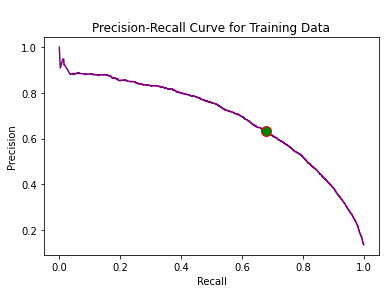

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score


precision, recall, thresholds = precision_recall_curve(y_train,preds_train_proba)

f1_scores = 2*recall*precision/(recall+precision)
opt_thresh_prc=thresholds[np.argmax(f1_scores)]
print('Optimal Threshold:', opt_thresh_prc)
print('Best F1-Score: ', np.max(f1_scores))
print('Index of Max F1:', np.argmax(f1_scores))
print('Average Precision Score (Area Under PR Curve):', average_precision_score(y_train,preds_train_proba))

optimal_idx = np.argmax(f1_scores)

#creating precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

#plotting optimal point
ax.plot(recall[optimal_idx], precision[optimal_idx], marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")

#adding axis labels to plot
ax.set_title('\nPrecision-Recall Curve for Training Data')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#displaying plot
plt.show()

### ROC Curve for Training Data

Index of Optimal Threshold: 4322
Optimal Probability Threshold: 0.12764841123160242
fpr coordinate: 0.15564903846153846
tpr coordinate: 0.8493859082094376
AUC: 0.9201471364363977


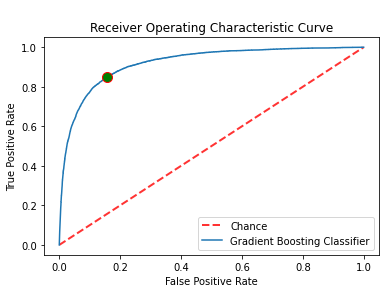

In [ ]:
fpr_train, tpr_train, thresholds = roc_curve(y_train,preds_train_proba)

# Determining Optimal Point on ROC Curve

# Your optimal point on the ROC curve (your optimal confusion matrix) depends on business requirements in addition to 
# mathematics.   Assuming no considerations that warrant selecting a higher TPR or a lower FPR, we attempt to balance the two.
# One way of considering the optimal point is 'balancing' TPR and FPR.  This is accomplished by finding the point on the
# curve with the maximum value of TPR - FPR.

optimal_idx = np.argmax(tpr_train - fpr_train)
optimal_threshold = thresholds[optimal_idx]

print(f'Index of Optimal Threshold: {optimal_idx}')
print(f'Optimal Probability Threshold: {optimal_threshold}')
print(f'fpr coordinate: {fpr_train[optimal_idx]}')
print(f'tpr coordinate: {tpr_train[optimal_idx]}')
print(f'AUC: {auc(fpr_train, tpr_train)}')

# Creating ROC curve for training data

plt.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)
plt.plot(fpr_train,tpr_train,label="Gradient Boosting Classifier")
plt.plot(fpr_train[optimal_idx], tpr_train[optimal_idx], marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")
plt.title('\nReceiver Operating Characteristic Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc="lower right")
plt.show()

# Predictions on Unseen Data (Test Set)

* **Predictions**

In [ ]:
# Predictions for Test Set

preds=gbc.predict(X_test)
print(np.where(preds==0,'No','Yes'))

# For the Target Variable , '0' means that the customer did not drop the service & '1' means that the customer dropped the service.

['No' 'Yes' 'No' ... 'No' 'No' 'Yes']


In [ ]:
preds_test_proba=gbc.predict_proba(X_test)

# Considering the Probabilities for the class of interest (1s)
preds_test_proba=preds_test_proba[:,1]

## Using Optimum Threshold From Precision-Recall Curve

* **Confusion Matrix**

In [ ]:
#Confusion Matrix at Optimal Point on Precision-Recall Curve using Training Data
print("Confusion Matrix at Optimal Point on Precision-Recall Curve using Training Data:\n")
print(confusion_matrix(y_test,preds_test_proba >opt_thresh_prc))

Confusion Matrix at Optimal Point on Precision-Recall Curve using Training Data:

[[9264  650]
 [ 588 1030]]


* **Accuracy Score**

In [ ]:
print(f'Test Set Accuracy Score: {accuracy_score(y_test, preds_test_proba>opt_thresh_prc)}')

Test Set Accuracy Score: 0.8926465487339577


* **Precision**

In [ ]:
# Precision for Test Set

tn, fp, fn, tp = confusion_matrix(y_test,preds_test_proba>opt_thresh_prc).ravel()
precision_test=tp/(tp+fp)
print("Precision for Test Set :",precision_test)

Precision for Test Set : 0.6130952380952381


* **Recall**

In [ ]:
# Recall for Test Set

tn, fp, fn, tp = confusion_matrix(y_test,preds_test_proba>opt_thresh_prc).ravel()
recall_test=tp/(tp+fn)
print("Recall for Test Set :",recall_test)

Recall for Test Set : 0.6365883807169345


## Using Optimum Threshold From ROC Curve

* **Confusion Matrix**

In [ ]:
#Confusion Matrix at Optimal Point on ROC Curve using Training Data
print("Confusion Matrix at Optimal Point on ROC Curve using Training Data:\n")
print(confusion_matrix(y_test,preds_test_proba >optimal_threshold))

Confusion Matrix at Optimal Point on ROC Curve using Training Data:

[[8257 1657]
 [ 304 1314]]


* **Accuracy Score**

In [ ]:
print(f'Test Set Accuracy Score: {accuracy_score(y_test, preds_test_proba>optimal_threshold)}')

Test Set Accuracy Score: 0.8299514394727714


* **Precision**

In [ ]:
tn, fp, fn, tp = confusion_matrix(y_test,preds_test_proba>optimal_threshold).ravel()
precision_test=tp/(tp+fp)
print("Precision for Test Set :",precision_test)

Precision for Test Set : 0.44227532817233256


* **Recall**

In [ ]:
# Recall for Test Set

tn, fp, fn, tp = confusion_matrix(y_test,preds_test_proba>optimal_threshold).ravel()
recall_test=tp/(tp+fn)
print("Recall for Test Set :",recall_test)

Recall for Test Set : 0.8121137206427689


### Precision-Recall Curve for Test Data

Average Precision Score (Area Under PR Curve): 0.6631663492304943


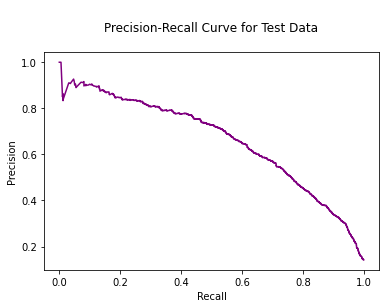

In [ ]:
precision, recall, thresholds = precision_recall_curve(y_test,preds_test_proba)

f1_scores = 2*recall*precision/(recall+precision)

print('Average Precision Score (Area Under PR Curve):', average_precision_score(y_test,preds_test_proba))

optimal_idx = np.argmax(f1_scores)

#creating precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

#adding axis labels to plot
ax.set_title('\nPrecision-Recall Curve for Test Data\n')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#displaying plot
plt.show()

### ROC Curve for Test Data

Area Under the Curve (AUC): 0.9015851527088462


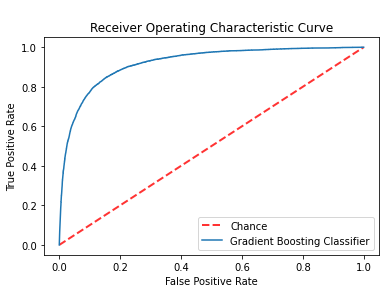

In [ ]:
# ROC Curve for Test Data

fpr_test, tpr_test, thresholds = roc_curve(y_test,preds_test_proba)

print(f'Area Under the Curve (AUC): {auc(fpr_test, tpr_test)}')


# Creating ROC curve for test data

plt.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)
plt.plot(fpr_train,tpr_train,label="Gradient Boosting Classifier")
plt.title('\nReceiver Operating Characteristic Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc="lower right")
plt.show()

## Feature Importance

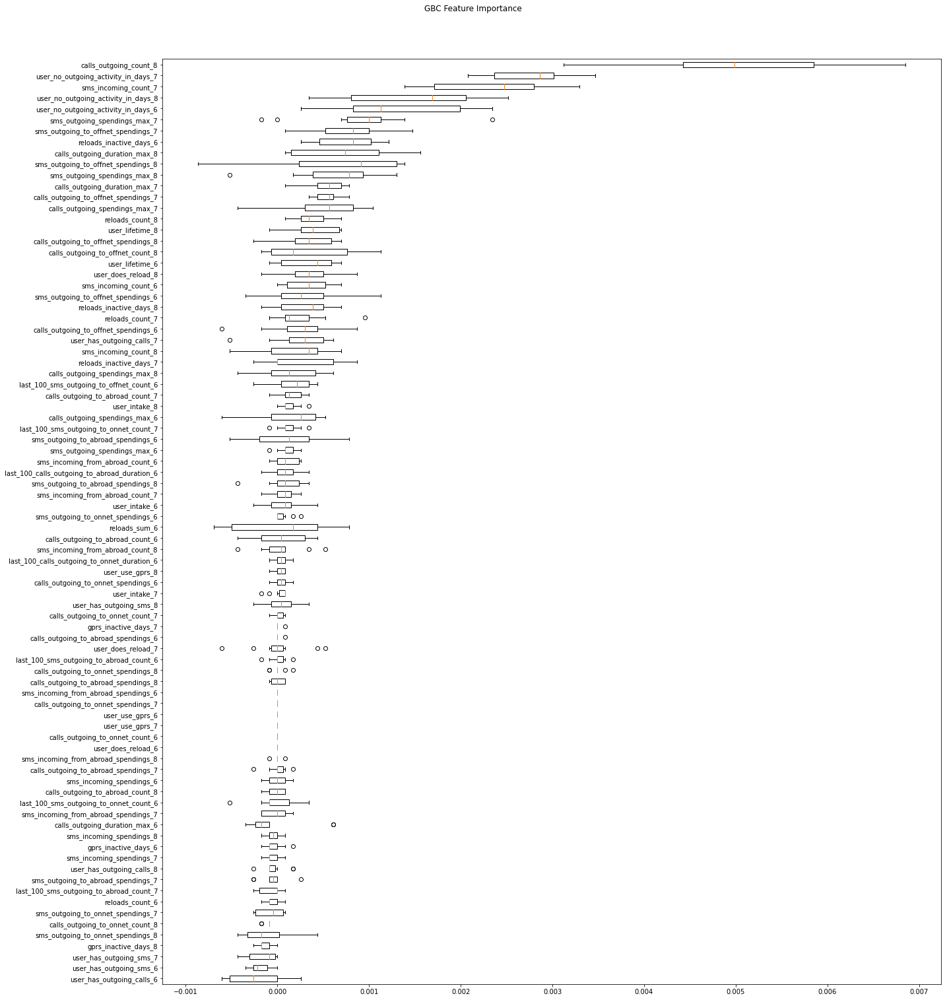

In [ ]:
from sklearn.inspection import permutation_importance

clf = gbc

result = permutation_importance(clf, X_test, y_test, n_repeats=10,
                                random_state=63)
perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, ax1 = plt.subplots(1, 1, figsize=(20, 20))
ax1.boxplot(result.importances[perm_sorted_idx].T, vert=False,
            labels=X.columns[perm_sorted_idx])
fig.suptitle('GBC Feature Importance', y=1.05)
fig.tight_layout()
plt.show()

* Here the X-axis represents a relative scale of importance (higher the better)

### The Top 3 Important Features that contribute the most to the model are:


1. **calls_outgoing_count_8 (Number of Outgoing Calls in Month 8)**
2. **user_no_outgoing_activity_in_days_7 (Number of Days when the customer did not do any action for Month 7)**
3. **sms_incoming_count_7 (Number of Incoming SMS Messages for Month 7)**

## **Understanding Customer Behavior**

### **Observation 1**


In [ ]:
df10 =  df_final.loc[df_final['calls_outgoing_count_8'] <= 50]

In [ ]:
import plotly.express as px
fig = px.histogram(data_frame=df10, x ="calls_outgoing_count_8", color="churn",width=420, height=420)
fig.update_layout(bargap=0.8)
fig.show()

* From the above plot for 'calls_outgoing_count_8' , we can see that as the number of outgoing calls made during month 8 increases , the proportion of people who drop the service compared to the people who did not drop the service decreases. (Proportion of 1s decreases compared to 0s)

* Hence, higher the number of outgoing calls made during month 8, lower the chances for the customer to drop the service.

### **Observation 2**


In [ ]:
df11 =  df_final.loc[df_final["user_no_outgoing_activity_in_days_7"] <= 40]

Text(0.5, 1.0, 'Box Plot for Number of Inactive Days_Month 7')

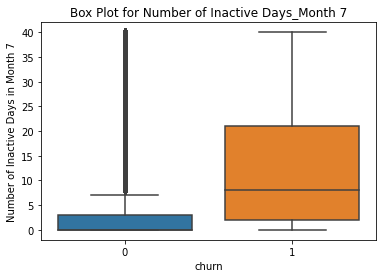

In [ ]:
sns.boxplot(x='churn',y="user_no_outgoing_activity_in_days_7",data=df11)
plt.ylabel("Number of Inactive Days in Month 7")
plt.title("Box Plot for Number of Inactive Days_Month 7")

* From the boxplot above for 'user_no_outgoing_activity_in_days_7', we can see that for the people who drop the service (1s) , the median of number of inactive days is much higher than for the people who might not drop the service.

* So, higher the duration for which a customer is inactive, higher the chances for the customer to drop the service.

### **Observation 3**


In [ ]:
df12 =  df_final.loc[df_final['sms_incoming_count_7'] <= 40]

In [ ]:
import plotly.express as px
fig = px.histogram(data_frame=df12, x ="sms_incoming_count_7", color="churn",width=500, height=500)
fig.update_layout(bargap=0.8)
fig.show()

* From the above plot for 'sms_incoming_count_7' , we can see that as the number of incoming sms messages received during month 7 increases , the proportion of people who drop the service compared to the people who did not drop the service decreases. (Proportion of 1s decreases compared to 0s)

* Hence, higher the number of incoming sms messages received during month 7, lower the chances for the customer to drop the service.

### **Observation 4**


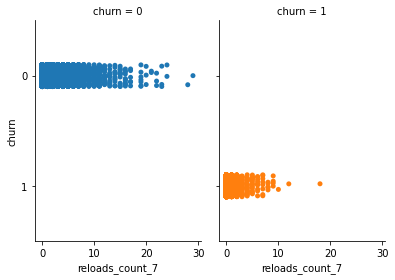

In [ ]:
sns.catplot(x="reloads_count_7", y="churn",
                #hue="churn", 
                col="churn",
                data=df_final, kind="strip",
                height=4, aspect=.7);

* From the above plot , we can see that the maximum number of recharges done by customers who might drop the service (1s) is closer to 10 while the customers who might not drop the service (0s) have number of recharges between 10 & 20 mostly.

* Therefore, as the number of recharges increase , there are lesser chances for the customers to drop the service.